In [1]:
library(ggplot2)
library("survival")
library("survminer")

Loading required package: ggpubr



In [2]:
datasets = readRDS("/home/ncpsb//new_mnt/Other/jx/web/data/fast_explore/data/Refence_datasets_with_therapy.rds")
datasets_mu = readRDS("/home/ncpsb//new_mnt/Other/jx/web/data/fast_explore/data/Refence_datasets_mutation_with_therapy.rds")
datasets_overview = read.csv("/home/ncpsb//new_mnt/Other/jx/web/data/fast_explore/data/datasets_overview.csv",quote = "")
datasets_names = read.csv("/home/ncpsb//new_mnt/Other/jx/web/data/fast_explore/data/dataset_name.csv",header = F,row.names = 1)

ref_single_OS = readRDS("/home/ncpsb//new_mnt/Other/jx/web/data/fast_explore/result_data/ref_OS_total_survival.rds")
ref_single_PFS = readRDS("/home/ncpsb//new_mnt/Other/jx/web/data/fast_explore/result_data/ref_PFS_total_survival.rds")

In [3]:
colnames(datasets_names) = "Cohort_name"
datasets_overview = cbind(datasets_names,datasets_overview)

In [4]:
datasets_overview$OS = FALSE
datasets_overview$PFS = FALSE
datasets_overview$RECIST = FALSE
datasets_overview$RESPONSE = FALSE
datasets_overview$TMB = FALSE
datasets_overview$RNA = FALSE
for(i in rownames(datasets_overview)){
    if( "OS_TIME" %in% colnames(datasets[[i]]) ){datasets_overview[i,"OS"] = TRUE}
    if( "PFS_TIME" %in% colnames(datasets[[i]]) ){datasets_overview[i,"PFS"] = TRUE}
    if( "RECIST" %in% colnames(datasets[[i]]) ){datasets_overview[i,"RECIST"] = TRUE}
    if( "RESPONSE" %in% colnames(datasets[[i]]) ){datasets_overview[i,"RESPONSE"] = TRUE}
    if( "TMB" %in% colnames(datasets[[i]]) ){datasets_overview[i,"TMB"] = TRUE}
}

datasets_overview[c("dataset2","dataset6","dataset8","dataset10","dataset11","dataset12","dataset13","dataset14","dataset20"),"RNA"] = TRUE

In [5]:
# 这是旧版本dataset_overview的归纳
datasets_overview$Cancer_type2 = datasets_overview$Cancer_type
# datasets_overview$Cancer_type2[ datasets_overview$Cancer_type %in% 
#                                c("Renal Cell Carcinoma","Renal Cell Carcinoma","Clear cell renal cell carcinoma")] = "Renal Cell Carcinoma"
# datasets_overview$Cancer_type2[ datasets_overview$Cancer_type %in% 
#                                c("Bladder Cancer","Urothelial cancer")] = "Urothelial Cancer"
# datasets_overview$Cancer_type2[ datasets_overview$Cancer_type %in% 
#                                c("Esophagogastric Cancer","Gastrointestinal cancer","Colorectal Cancer","Gastric cancer","Neuroendocrine neoplasms","Gastrointestinal cancer","Hepatocellular carcinoma")] = "Gastrointestinal Cancer"
# datasets_overview$Cancer_type2[ datasets_overview$Cancer_type %in% 
#                                c("Glioblastoma","Glioma")] = "Glioblastoma"
datasets_overview$Cancer_type2[ datasets_overview$Cancer_type %in% 
                               c("Esophagogastric Cancer","Colorectal Cancer","Pan-GI cancer","Neuroendocrine tumours","Hepatocellular carcinoma")] = "Gastrointestinal Cancer"

In [6]:
datasets_names$Cohort_name = gsub(pattern = "[0-9]*\\. (.*).*\\(.*","\\1",datasets_names$Cohort_name)
datasets_overview$Cohort_name = datasets_names$Cohort_name

In [7]:
dataset_meta = read.csv("/home/ncpsb/new_mnt/Other/jx/web/data/fast_explore/data/dataset_name.csv",header = F)
dataset_name = dataset_meta$V2
names(dataset_name) = dataset_meta$V1

dataset_name = gsub(pattern = "[0-9]*\\. (.*).*\\(.*","\\1",dataset_name)

In [8]:
datasets_overview

,Cohort_name,Cohort,Cancer_type,Cohort_size,Immune_checkpoint_blockade,Sequencing,OS,PFS,RECIST,RESPONSE,TMB,RNA,Cancer_type2
,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<chr>
dataset1.1,"Samstein et al, Bladder Cancer",Samstein et al,Bladder Cancer,215,Mixed ICB,Panel,TRUE,FALSE,FALSE,FALSE,TRUE,FALSE,Bladder Cancer
dataset1.2,"Samstein et al, Breast Cancer",Samstein et al,Breast Cancer,44,Mixed ICB,Panel,TRUE,FALSE,FALSE,FALSE,TRUE,FALSE,Breast Cancer
dataset1.3,"Samstein et al, Colorectal Cancer",Samstein et al,Colorectal Cancer,110,Mixed ICB,Panel,TRUE,FALSE,FALSE,FALSE,TRUE,FALSE,Gastrointestinal Cancer
dataset1.4,"Samstein et al, Esophagogastric Cancer",Samstein et al,Esophagogastric Cancer,126,Mixed ICB,Panel,TRUE,FALSE,FALSE,FALSE,TRUE,FALSE,Gastrointestinal Cancer
dataset1.5,"Samstein et al, Glioma",Samstein et al,Glioblastoma,117,Mixed ICB,Panel,TRUE,FALSE,FALSE,FALSE,TRUE,FALSE,Glioblastoma
dataset1.6,"Samstein et al, Head and Neck Cancer",Samstein et al,Head and Neck Cancer,139,Mixed ICB,Panel,TRUE,FALSE,FALSE,FALSE,TRUE,FALSE,Head and Neck Cancer
dataset1.7,"Samstein et al, Melanoma",Samstein et al,Melanoma,320,Mixed ICB,Panel,TRUE,FALSE,FALSE,FALSE,TRUE,FALSE,Melanoma
dataset1.8,"Samstein et al, NSCLC",Samstein et al,Non-small cell lung cancer,350,Mixed ICB,Panel,TRUE,FALSE,FALSE,FALSE,TRUE,FALSE,Non-small cell lung cancer
dataset1.9,"Samstein et al, Renal Cell Carcinoma",Samstein et al,Kidney Cancer,151,Mixed ICB,Panel,TRUE,FALSE,FALSE,FALSE,TRUE,FALSE,Kidney Cancer


# Figure 1

### OS部分

In [9]:
ref_single_significant_OS = list()

for(i in names(ref_single_OS)){
        tmp_data = ref_single_OS[[i]]
        less_num = floor(unique(rowSums(tmp_data[,c("Patient(Mutation)","Patient(Wildtype)")])) * 0.05) # 两个组至少包含的患者数是总人数的5%
        if(less_num <3){less_num = 3}
        tmp_data = tmp_data[ tmp_data$`Patient(Mutation)` >= less_num & tmp_data$`Patient(Wildtype)` >= less_num,]
#         tmp = tmp[ tmp$`Log_rank_test(OS)`<0.05 | tmp$`Wald_test(OS)` < 0.05,]  # 筛选P值小于0.05
        if(nrow(tmp_data) != 0){
            tmp_data$dataset = i
            tmp_data$Cancer_type = datasets_overview[i,"Cancer_type"]
            tmp_data$Cancer_type2 = datasets_overview[i,"Cancer_type2"]
            tmp_data$gene = rownames(tmp_data)
        }  
        ref_single_significant_OS[[i]] = tmp_data
}

In [10]:
# 这里已经将dataset1 和 dataset3 去除了
OS_combind = vector()
for(i in names(ref_single_significant_OS)){
    if(!i %in%  c("dataset5","dataset7","dataset13","dataset16","dataset1","dataset3","dataset6") & nrow(ref_single_significant_OS[[i]]) != 0){
        OS_combind = rbind(OS_combind,ref_single_significant_OS[[i]])
    }
    
}

In [11]:
OS_combind$RS = -log(x = OS_combind$`Wald_test(OS)`,20) * log10(OS_combind$`HR(OS)`)

In [12]:
OS_combind[ grepl(',|\\"|know',OS_combind$gene),]

,Log_rank_test(OS),Wald_test(OS),HR(OS),"Lower(95%, OS)","Upper(95%, OS)",Patient(Mutation),Patient(Wildtype),dataset,Cancer_type,Cancer_type2,gene,RS
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
Unknown,0.37103919,0.37169660,1.3527968,0.69710616,2.625223,93,17,dataset2,Melanoma,Melanoma,Unknown,0.04335430
Unknown1,0.09121199,0.10158650,2.4113018,0.84070641,6.916061,10,17,dataset3.1,Bladder Cancer,Bladder Cancer,Unknown,0.29179842
Unknown2,0.18374861,0.18551376,1.3591968,0.86292882,2.140867,47,104,dataset3.2,Melanoma,Melanoma,Unknown,0.07495026
Unknown3,0.30572287,0.31426835,1.6578640,0.61935195,4.437724,29,27,dataset3.3,Non-small cell lung cancer,Non-small cell lung cancer,Unknown,0.08483055
"""OR8U1,OR8U8""",0.34051113,0.34360860,1.4880034,0.65372571,3.386977,16,76,dataset9,Pan-GI cancer,Gastrointestinal Cancer,"""OR8U1,OR8U8""",0.06154906
"""POTEB,POTEB2,POTEB3""",0.05250044,0.06555438,3.0654655,0.93044771,10.099524,4,88,dataset9,Pan-GI cancer,Gastrointestinal Cancer,"""POTEB,POTEB2,POTEB3""",0.44251020
"""HNRNPCL1,HNRNPCL3,HNRNPCL4""",0.53278850,0.53461004,0.7203680,0.25583767,2.028357,13,79,dataset9,Pan-GI cancer,Gastrointestinal Cancer,"""HNRNPCL1,HNRNPCL3,HNRNPCL4""",-0.02977634
"""ANKHD1,ANKHD1-EIF4EBP3""",0.29423504,0.30526683,0.4748303,0.11432764,1.972085,6,86,dataset9,Pan-GI cancer,Gastrointestinal Cancer,"""ANKHD1,ANKHD1-EIF4EBP3""",-0.12811877
"""P2RY11,PPAN-P2RY11""",0.21418873,0.24105115,0.3037232,0.04142683,2.226764,4,88,dataset9,Pan-GI cancer,Gastrointestinal Cancer,"""P2RY11,PPAN-P2RY11""",-0.24578379


In [13]:
OS_combind = OS_combind[ OS_combind$gene != "Unknown",]
OS_combind$gene[ OS_combind$gene == '"ANKHD1,ANKHD1-EIF4EBP3"'] = "ANKHD1"
OS_combind$gene[ OS_combind$gene == '"HNRNPCL1,HNRNPCL3,HNRNPCL4"'] = "HNRNPCL1"
OS_combind$gene[ OS_combind$gene == '"OR8U1,OR8U8"'] = "OR8U1"
OS_combind$gene[ OS_combind$gene == '"P2RY11,PPAN-P2RY11"'] = "P2RY11"
OS_combind$gene[ OS_combind$gene == '"POTEB,POTEB2,POTEB3"'] = "POTEB"

In [14]:
RS_matrix_OS = reshape2::dcast(data = OS_combind[,c("dataset","RS","gene")],formula = gene~dataset,value.var = "RS",fill = 0)
rownames(RS_matrix_OS) = RS_matrix_OS$gene
RS_matrix_OS$gene = NULL

In [15]:
# 每个瘤种为一个单位，计算单瘤种的数据集鲁棒性,为了让具有更多的数据集的瘤种在计算得分时，具有更高的赋值，所以计算平均数据集得分后，会乘以一个同方向数据集个数
for(i in unique(datasets_overview$Cancer_type2)){
    tmp_datasets = rownames(datasets_overview)[ datasets_overview$Cancer_type2 %in% i]
    tmp_datasets = intersect(tmp_datasets,colnames(RS_matrix_OS))
    RS_matrix_OS[[i]] = apply(X = RS_matrix_OS[tmp_datasets],1,function(x){
        meanscore = mean(x[x !=0 ])
        meanscore2 = ifelse(sign(meanscore) == 1, meanscore*sum(x > 0 ),
                          ifelse(sign(meanscore) == -1,meanscore*sum(x < 0 ),0))
        
        return(meanscore2)
    })
    RS_matrix_OS[[i]][is.na(RS_matrix_OS[[i]])] = 0
}

for(i in unique(datasets_overview$Cancer_type2)){
    tmp_datasets = rownames(datasets_overview)[ datasets_overview$Cancer_type2 %in% i]
    tmp_datasets = intersect(tmp_datasets,colnames(RS_matrix_OS))
    seq_weight = ifelse(datasets_overview[tmp_datasets,"Sequencing"] == "Panel",0.5,1)
    cn = paste(i,"seq",sep = "_")
    RS_matrix_OS[[cn]] = apply(X = RS_matrix_OS[tmp_datasets],1,function(x){
#         meanscore = sum(x[ x != 0 ] * seq_weight[ x != 0 ])/sum( x != 0)
        meanscore = mean(x[x != 0 ])
        meanscore2 = ifelse(sign(meanscore) == 1,meanscore*sum(seq_weight[x>0]),meanscore*sum(seq_weight[x<0]))
        
        return(meanscore2)
    })
    RS_matrix_OS[[cn]][is.na(RS_matrix_OS[[cn]])] = 0
}

In [16]:
# 简单的加和可能会导致某些在个别数据集上表现特别好的基因过分地增大了最后得分
RS_matrix_OS$MultiTumor_ALL_pan = apply(RS_matrix_OS[,unique(datasets_overview$Cancer_type2)],1,function(x){
    meanscore = mean(x)
    ifelse(sign(meanscore) == 1,meanscore*sum(x>0),meanscore*sum(x<0))
})

RS_matrix_OS$MultiTumor_ALL_pan_clean = apply(RS_matrix_OS[,setdiff(unique(datasets_overview$Cancer_type2),c("Pan-cancer","Microsatellite-stable solid tumors"))],1,function(x){
    meanscore = mean(x)
    ifelse(sign(meanscore) == 1,meanscore*sum(x>0),meanscore*sum(x<0))
})

RS_matrix_OS$MultiTumor_ALL_pan_seq = apply(RS_matrix_OS[,paste(unique(datasets_overview$Cancer_type2),"seq",sep = "_")],1,function(x){
    meanscore = mean(x)
    ifelse(sign(meanscore) == 1,meanscore*sum(x>0),meanscore*sum(x<0))
})

RS_matrix_OS$MultiTumor_ALL_pan_clean_seq = apply(RS_matrix_OS[,setdiff(paste(unique(datasets_overview$Cancer_type2),"seq",sep = "_"),
                                                              c("Pan-cancer_seq","Microsatellite-stable solid tumors_seq"))],1,function(x){
    meanscore = mean(x)
    ifelse(sign(meanscore) == 1,meanscore*sum(x>0),meanscore*sum(x<0))
})

In [17]:
RS_matrix_OS = RS_matrix_OS[ order(RS_matrix_OS$MultiTumor_ALL_pan_clean,decreasing = F),]

In [18]:
P_matrix_OS = reshape2::dcast(data = OS_combind[,c("dataset","Wald_test(OS)","gene")],formula = dataset~gene,value.var = "Wald_test(OS)",fill = 0)
rownames(P_matrix_OS) = P_matrix_OS$dataset
P_matrix_OS$dataset = NULL

m = apply(P_matrix_OS,2,function(x){sum(x != 0 & x < 0.05)})[ rownames(RS_matrix_OS)]
m[is.na(m)] = 0
RS_matrix_OS$Sig.Num = m

### PFS部分

In [19]:
ref_single_significant_PFS = list()

for(i in names(ref_single_PFS)){
        tmp_data = ref_single_PFS[[i]]
        less_num = floor(unique(rowSums(tmp_data[,c("Patient(Mutation)","Patient(Wildtype)")])) * 0.05) # 两个组至少包含的患者数是总人数的5%
        if(less_num <3){less_num = 3}
        tmp_data = tmp_data[ tmp_data$`Patient(Mutation)` >= less_num & tmp_data$`Patient(Wildtype)` >= less_num,]
        if(nrow(tmp_data) != 0){
            tmp_data$dataset = i
            tmp_data$Cancer_type = datasets_overview[i,"Cancer_type"]
            tmp_data$Cancer_type2 = datasets_overview[i,"Cancer_type2"]
            tmp_data$gene = rownames(tmp_data)
        }  
        ref_single_significant_PFS[[i]] = tmp_data
}

In [20]:
# 这里已经将dataset1 和 dataset3 去除了
PFS_combind = vector()
for(i in names(ref_single_significant_PFS)){
    if(!i %in%  c("dataset1.1","dataset1.2","dataset1.3","dataset1.4","dataset1.5","dataset1.6","dataset1.7","dataset1.8","dataset1.9",
                        "dataset1","dataset8","dataset10","dataset11","dataset1","dataset3","dataset6") & nrow(ref_single_significant_PFS[[i]]) != 0){
        PFS_combind = rbind(PFS_combind,ref_single_significant_PFS[[i]])
    }
    
}

In [21]:
PFS_combind$RS = -log(x = PFS_combind$`Wald_test(PFS)`,20) * log10(PFS_combind$`HR(PFS)`)

In [22]:
PFS_combind[ grepl(',|\\"|know',PFS_combind$gene),]

,Log_rank_test(PFS),Wald_test(PFS),HR(PFS),"Lower(95%, PFS)","Upper(95%, PFS)",Patient(Mutation),Patient(Wildtype),dataset,Cancer_type,Cancer_type2,gene,RS
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
Unknown,0.8076885,0.8114674,1.0714495,0.60771855,1.889039,93,17,dataset2,Melanoma,Melanoma,Unknown,0.002090113
Unknown1,0.6890641,0.6918400,1.6358472,0.14348363,18.650183,10,17,dataset3.1,Bladder Cancer,Bladder Cancer,Unknown,0.026285037
Unknown2,0.7136466,0.7076382,1.1255922,0.60653487,2.088846,47,104,dataset3.2,Melanoma,Melanoma,Unknown,0.005931345
Unknown3,0.2948705,0.3054900,1.8651729,0.56614174,6.144875,29,27,dataset3.3,Non-small cell lung cancer,Non-small cell lung cancer,Unknown,0.107162147
"""OR8U1,OR8U8""",0.2506031,0.2493511,1.4541549,0.76901399,2.749711,16,76,dataset9,Pan-GI cancer,Gastrointestinal Cancer,"""OR8U1,OR8U8""",0.075390206
"""POTEB,POTEB2,POTEB3""",0.7904387,0.7883301,1.1726918,0.36654329,3.751825,4,88,dataset9,Pan-GI cancer,Gastrointestinal Cancer,"""POTEB,POTEB2,POTEB3""",0.005492675
"""HNRNPCL1,HNRNPCL3,HNRNPCL4""",0.1681235,0.1748272,1.5739325,0.81741315,3.030614,13,79,dataset9,Pan-GI cancer,Gastrointestinal Cancer,"""HNRNPCL1,HNRNPCL3,HNRNPCL4""",0.114674899
"""ANKHD1,ANKHD1-EIF4EBP3""",0.3119847,0.3174312,0.5528507,0.17298271,1.766904,6,86,dataset9,Pan-GI cancer,Gastrointestinal Cancer,"""ANKHD1,ANKHD1-EIF4EBP3""",-0.098592266
"""P2RY11,PPAN-P2RY11""",0.1577939,0.1888972,0.2656588,0.03677446,1.919119,4,88,dataset9,Pan-GI cancer,Gastrointestinal Cancer,"""P2RY11,PPAN-P2RY11""",-0.320253576


In [23]:
PFS_combind = PFS_combind[ PFS_combind$gene != "Unknown",]
PFS_combind$gene[ PFS_combind$gene == '"ANKHD1,ANKHD1-EIF4EBP3"'] = "ANKHD1"
PFS_combind$gene[ PFS_combind$gene == '"HNRNPCL1,HNRNPCL3,HNRNPCL4"'] = "HNRNPCL1"
PFS_combind$gene[ PFS_combind$gene == '"OR8U1,OR8U8"'] = "OR8U1"
PFS_combind$gene[ PFS_combind$gene == '"P2RY11,PPAN-P2RY11"'] = "P2RY11"
PFS_combind$gene[ PFS_combind$gene == '"POTEB,POTEB2,POTEB3"'] = "POTEB"

In [24]:
RS_matrix_PFS = reshape2::dcast(data = PFS_combind[,c("dataset","RS","gene")],formula = gene~dataset,value.var = "RS",fill = 0)
rownames(RS_matrix_PFS) = RS_matrix_PFS$gene
RS_matrix_PFS$gene = NULL

In [25]:
# 每个瘤种为一个单位，计算单瘤种的数据集鲁棒性,为了让具有更多的数据集的瘤种在计算得分时，具有更高的赋值，所以计算平均数据集得分后，会乘以一个同方向数据集个数
for(i in unique(datasets_overview$Cancer_type2)){
    tmp_datasets = rownames(datasets_overview)[ datasets_overview$Cancer_type2 %in% i]
    tmp_datasets = intersect(tmp_datasets,colnames(RS_matrix_PFS))
    RS_matrix_PFS[[i]] = apply(X = RS_matrix_PFS[tmp_datasets],1,function(x){
        meanscore = mean(x[x !=0 ])
        meanscore2 = ifelse(sign(meanscore) == 1, meanscore*sum(x > 0 ),
                          ifelse(sign(meanscore) == -1,meanscore*sum(x < 0 ),0))
        
        return(meanscore2)
    })
    RS_matrix_PFS[[i]][is.na(RS_matrix_PFS[[i]])] = 0
}

for(i in unique(datasets_overview$Cancer_type2)){
    tmp_datasets = rownames(datasets_overview)[ datasets_overview$Cancer_type2 %in% i]
    tmp_datasets = intersect(tmp_datasets,colnames(RS_matrix_PFS))
    seq_weight = ifelse(datasets_overview[tmp_datasets,"Sequencing"] == "Panel",0.5,1)
    cn = paste(i,"seq",sep = "_")
    RS_matrix_PFS[[cn]] = apply(X = RS_matrix_PFS[tmp_datasets],1,function(x){
#         meanscore = sum(x[ x != 0 ] * seq_weight[ x != 0 ])/sum( x != 0)
        meanscore = mean(x[x != 0 ])
        meanscore2 = ifelse(sign(meanscore) == 1,meanscore*sum(seq_weight[x>0]),meanscore*sum(seq_weight[x<0]))
        
        return(meanscore2)
    })
    RS_matrix_PFS[[cn]][is.na(RS_matrix_PFS[[cn]])] = 0
}

In [26]:
# 简单的加和可能会导致某些在个别数据集上表现特别好的基因过分地增大了最后得分
RS_matrix_PFS$MultiTumor_ALL_pan = apply(RS_matrix_PFS[,unique(datasets_overview$Cancer_type2)],1,function(x){
    meanscore = mean(x)
    ifelse(sign(meanscore) == 1,meanscore*sum(x>0),meanscore*sum(x<0))
})

RS_matrix_PFS$MultiTumor_ALL_pan_clean = apply(RS_matrix_PFS[,setdiff(unique(datasets_overview$Cancer_type2),c("Pan-cancer","Microsatellite-stable solid tumors"))],1,function(x){
    meanscore = mean(x)
    ifelse(sign(meanscore) == 1,meanscore*sum(x>0),meanscore*sum(x<0))
})

RS_matrix_PFS$MultiTumor_ALL_pan_seq = apply(RS_matrix_PFS[,paste(unique(datasets_overview$Cancer_type2),"seq",sep = "_")],1,function(x){
    meanscore = mean(x)
    ifelse(sign(meanscore) == 1,meanscore*sum(x>0),meanscore*sum(x<0))
})

RS_matrix_PFS$MultiTumor_ALL_pan_clean_seq = apply(RS_matrix_PFS[,setdiff(paste(unique(datasets_overview$Cancer_type2),"seq",sep = "_"),
                                                              c("Pan-cancer_seq","Microsatellite-stable solid tumors_seq"))],1,function(x){
    meanscore = mean(x)
    ifelse(sign(meanscore) == 1,meanscore*sum(x>0),meanscore*sum(x<0))
})

In [27]:
RS_matrix_PFS = RS_matrix_PFS[ order(RS_matrix_PFS$MultiTumor_ALL_pan_clean,decreasing = F),]

In [28]:
P_matrix_PFS = reshape2::dcast(data = PFS_combind[,c("dataset","Wald_test(PFS)","gene")],formula = dataset~gene,value.var = "Wald_test(PFS)",fill = 0)
rownames(P_matrix_PFS) = P_matrix_PFS$dataset
P_matrix_PFS$dataset = NULL

m = apply(P_matrix_PFS,2,function(x){sum(x != 0 & x < 0.05)})[ rownames(RS_matrix_PFS)]
m[is.na(m)] = 0
RS_matrix_PFS$Sig.Num = m

### 合并

In [29]:
A = RS_matrix_OS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),"MultiTumor_ALL_pan_clean"]
B = RS_matrix_PFS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),"MultiTumor_ALL_pan_clean"]
A[is.na(A)] = 0
B[is.na(B)] = 0

In [30]:
C = A+B
names(C) = unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS)))

In [31]:
C = sort(C)

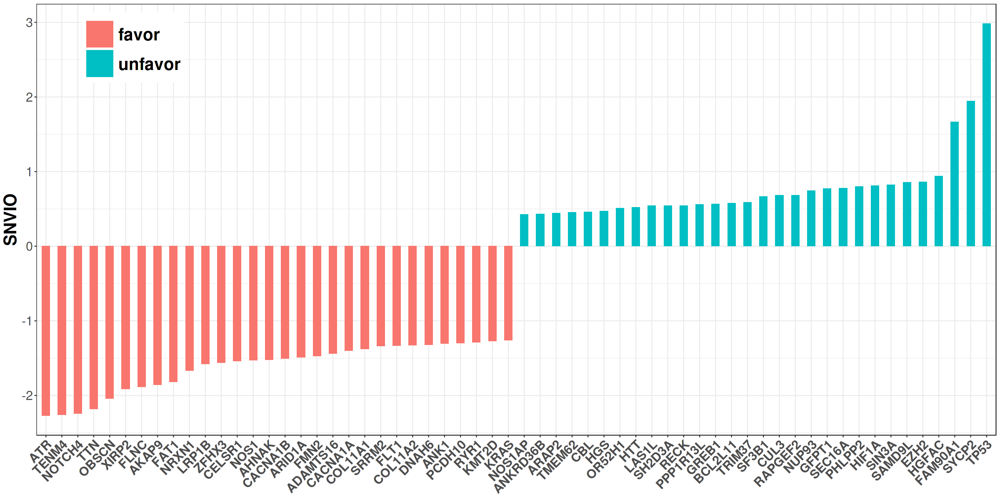

In [32]:
tmp_matrix = data.frame(MultiTumor_ALL_pan_clean=C[c(names(C)[1:30],names(C)[(length(C)-29):length(C)])],
                        gene = c(names(C)[1:30],names(C)[(length(C)-29):length(C)]),
                       color = c(rep("favor",30),rep("unfavor",30))
                       )
tmp_matrix$gene = factor(tmp_matrix$gene,levels = tmp_matrix$gene)
options(repr.plot.height = 10, repr.plot.width = 20)
ggplot(data = tmp_matrix)+
    geom_bar(aes(x = gene,y = MultiTumor_ALL_pan_clean,fill=color),stat = "identity",width=0.5)+
    theme_bw()+guides(fill=guide_legend(override.aes = list(size=15)))+
    theme(axis.text.x = element_text(angle = 45,hjust = 1,size=18,face = "bold"),
          axis.title.y = element_text(size = 24,face="bold"),
          axis.text.y = element_text(size = 18),
          legend.title = element_blank(),
          legend.text = element_text(size = 24,face = "bold"),
          axis.title.x = element_blank(),
          legend.position = c(0.1,0.9))+
    ylab("SNVIO")

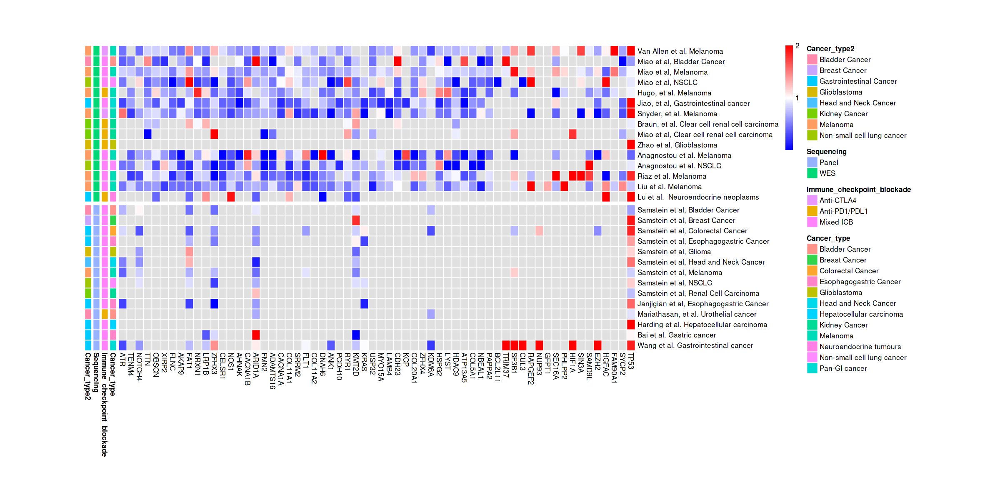

In [33]:
n1 = 45
n2 = 17
n2 = n2-1
# 此时地HR_matrix是没有去除p值不过地
options(repr.plot.height = 10, repr.plot.width = 20)
HR_matrix = reshape2::dcast(data = OS_combind[,c("dataset","HR(OS)","gene")],formula = dataset~gene,value.var = "HR(OS)")
rownames(HR_matrix) = HR_matrix$dataset
HR_matrix$dataset = NULL

HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
rownames(HR_matrix) = datasets_names[rownames(HR_matrix),]

meta = datasets_overview[ datasets_overview$Cohort_name %in% rownames(HR_matrix),]
rownames(meta) = meta$Cohort_name
meta = meta[,c("Cancer_type","Immune_checkpoint_blockade","Sequencing","Cancer_type2")]

hm = HR_matrix[ ,c(names(C)[1:n1],names(C)[(length(C)-n2):length(C)])]
hm[ hm > 2 ] = 2
hm = hm[order(meta$Sequencing,decreasing = T),]
# hm = hm[ rowSums(is.na(hm)) != ncol(hm),]

pheatmap::pheatmap(hm,cellwidth = 12,cellheight = 15,
                   border_color = "white",
                   annotation_row = meta,
                   gaps_row = 15,
#                    annotation_colors = list("Sequencing"=c("Panel" = "blue","WES"="red"),
#                                             "Immune_checkpoint_blockade"=Immune_checkpoint_blockade,
#                                             "Cancer_type" = Cancer_type),
                   cluster_rows = F,
                   cluster_cols = F,
                   color = colorRampPalette(colors = c("blue","white","red"))(100),
                   legend_breaks = c(2,1,0),
                   legend_labels = c(2,1,0),
                   na_col = "grey88"
                   )

rn = rownames(hm)
sg = colnames(hm)

In [34]:
plot_complexheatmap = function(C,tmp,sur = "OS",favor_num,unfavor_num){
    
    library(ComplexHeatmap)

    n1 = favor_num
    n2 = unfavor_num
    n2 = n2-1
    # 此时地HR_matrix是没有去除p值不过地

    if(sur == "PFS"){
        HR_matrix = reshape2::dcast(data = tmp[,c("dataset","HR(PFS)","gene")],formula = dataset~gene,value.var = "HR(PFS)")
    }else{
        HR_matrix = reshape2::dcast(data = tmp[,c("dataset","HR(OS)","gene")],formula = dataset~gene,value.var = "HR(OS)")
    }
    
    rownames(HR_matrix) = HR_matrix$dataset
    HR_matrix$dataset = NULL

    HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
    rownames(HR_matrix) = datasets_names[rownames(HR_matrix),]

    meta = datasets_overview[ datasets_overview$Cohort_name %in% rownames(HR_matrix),]
    rownames(meta) = meta$Cohort_name
    meta = meta[,c("Cancer_type","Immune_checkpoint_blockade","Sequencing","Cancer_type2")]

    hm = HR_matrix[ ,c(names(C)[1:n1],names(C)[(length(C)-n2):length(C)])]
    hm[ hm > 2 ] = 2 # HR超过2的都等于2
    hm = hm[order(meta$Sequencing,decreasing = T),]


    rn = rownames(hm)

    # cancer_type的顺序是按照数据集个数排列的
#     cancer_type =  c("Melanoma","Gastrointestinal Cancer","Urothelial Cancer","Renal Cell Carcinoma",
#                      "Non-small cell lung cancer","Glioblastoma","Hepatocellular carcinoma","Head and Neck Cancer",
#                      "Breast Cancer","Pan-cancer")
    cancer_type =  c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                     "Glioblastoma","Head and Neck Cancer",
                     "Breast Cancer")
#     a = colorRampPalette(RColorBrewer::brewer.pal(9,"Set1"))(10)
    a = colorRampPalette(RColorBrewer::brewer.pal(9,"Set1"))(8)
    names(a) = cancer_type

    row_ha1 = HeatmapAnnotation(
        show_legend = F,
        which = "row",
        CancerType=meta[rownames(hm),"Cancer_type2"],
        col = list(CancerType = a),
        show_annotation_name = F,
        annotation_legend_param  = list(
                                            title = "Cancer_Type", legend_height = unit(8, "cm"),
                                            title_gp = gpar(fontsize = 18,fontface = "bold"),
                                            labels_gp = gpar(fontsize = 18,fontface = "bold"),
                                            title_position = "leftcenter-rot"
                                       )

    )
    row_ha2 = HeatmapAnnotation(
        show_legend = F,
        which = "row",
        Sequencing=factor(meta[rownames(hm),"Sequencing"],levels = c("WES","Panel")),
        col = list(Sequencing = c("WES"="indianred1","Panel"="skyblue")),
        show_annotation_name = F,
        annotation_legend_param  = list(
                                            title = "Sequencing", legend_height = unit(8, "cm"),
                                            title_gp = gpar(fontsize = 18,fontface = "bold"),
                                            labels_gp = gpar(fontsize = 18,fontface = "bold"),
                                            title_position = "leftcenter-rot"
                                       )

    )

    ht = Heatmap(as.matrix(hm),width = ncol(hm)*unit(7, "mm"),height = nrow(hm)*unit(10, "mm"),
    #              heatmap_height = unit(20,"cm"),
    #              heatmap_width = unit(40,"cm"),
                 row_names_side = "left",
                 column_names_side = "bottom",
                 heatmap_legend_param = list(title = "HR", legend_height = unit(10, "cm"),
                                            title_gp = gpar(fontsize = 28,fontface = "bold"),
                                            labels_gp = gpar(fontsize = 24,fontface = "bold"),
                                            title_position = "leftcenter-rot"
        #                                     at = c( 0,0.25,0.5,0.75, 1)
                                           ),
    #              left_annotation = row_ha2,
    #              right_annotation = row_ha1,
                 top_annotation = HeatmapAnnotation(SNV_Score = anno_barplot(C[colnames(hm)],
                                                                             axis_param = list(side = "left",
                                                                                               gp = gpar(fontsize = 22,fontface = "bold")),
                                                                              gp = gpar(fill = c(colorRampPalette(rev(RColorBrewer::brewer.pal(n =9,name = "Blues")))(n1),
                                                                                                 colorRampPalette(RColorBrewer::brewer.pal(n =9,name = "Reds"))(n2+1)
                                                                                                )
                                                                                       )
                                                                     ),
                                                    annotation_name_gp = gpar(fontsize = 22,fontface = "bold"),
                                                    height = unit(10, "cm"),
                                                    show_annotation_name = T),
                  
#                  row_split = factor(meta[rownames(hm),"Cancer_type2"],levels = c("Melanoma","Gastrointestinal Cancer","Urothelial Cancer","Renal Cell Carcinoma",
#                                                                                 "Non-small cell lung cancer","Glioblastoma","Hepatocellular carcinoma","Head and Neck Cancer","Breast Cancer","Pan-cancer")),
                 row_split = factor(meta[rownames(hm),"Cancer_type2"],levels = c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                                                                                "Glioblastoma","Head and Neck Cancer","Breast Cancer")),
                 row_title = NULL,
                 row_gap = unit(5, "mm"),
                 row_names_max_width = max_text_width(rownames(hm),gp = gpar(fontsize = 12)),
                 column_names_max_height = max_text_width(colnames(hm),gp = gpar(cex = 22)),
                 row_names_gp = gpar(fontface = "bold",cex = 2),
                 column_names_gp = gpar(fontface = "bold",cex = 1.8),
    #         col = colorRamp2(c( 0,0.25,0.5,0.75, 1), c("#FFFFE5","#C7E9B4", "#41B6C4","#225EA8","#081D58")),
            cluster_rows = F,
            cluster_columns = F,
            rect_gp = gpar(col = "white", lwd = 5)
           )


    l1 =  Legend(
            labels = cancer_type,
            title = "Cancer Type",
            legend_gp = gpar(fill = a,fontsize = 20),
            title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
            labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )
    l2 = Legend(
            labels = c("WES","Panel"),
            title = "Sequencing",
            legend_gp = gpar(fill = c("indianred1","skyblue"),fontsize = 20),
            title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
            labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )

    options(repr.plot.height = 20, repr.plot.width = 35)

    ht_opt$HEATMAP_LEGEND_PADDING = unit(9, "cm")
    ht_opt$ANNOTATION_LEGEND_PADDING = unit(2, "cm")
    draw(ht+row_ha1+row_ha2,
         heatmap_legend_side ="left",
         annotation_legend_side = "right",
         annotation_legend_list = packLegend(l1,l2,row_gap = unit(2.5,"cm"),gap = unit(2.5,"cm"))
        )

    
    
}

Loading required package: grid

ComplexHeatmap version 2.6.2
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite:
Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
  genomic data. Bioinformatics 2016.

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))




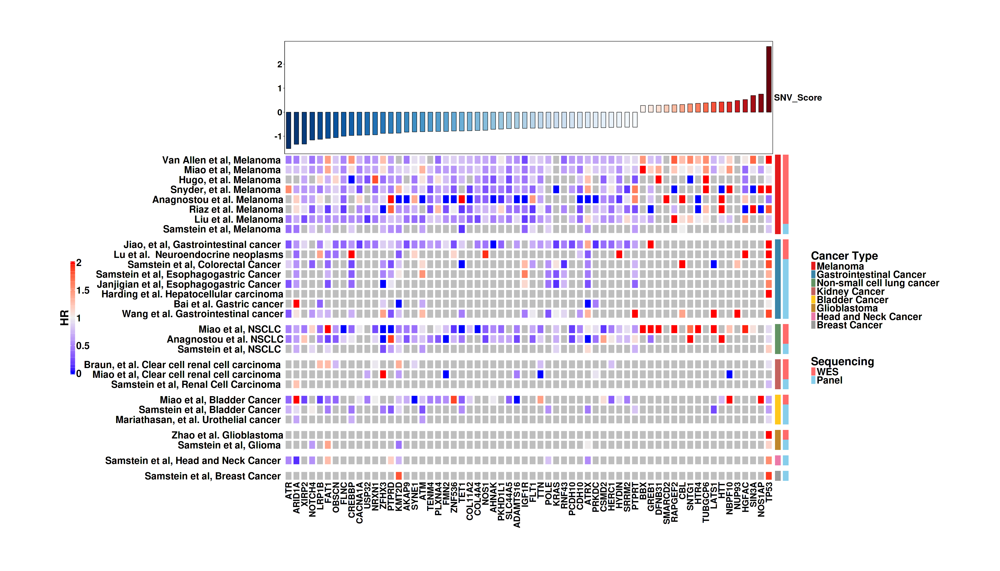

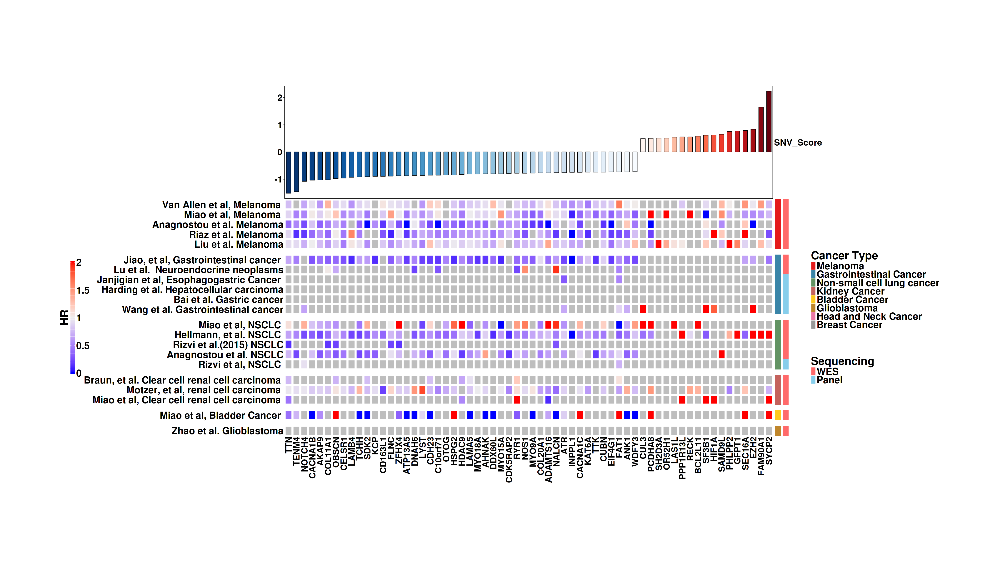

In [35]:
# 这是OS和PFS根据各自的SNVscore排序的基因热图
plot_complexheatmap(setNames(object = RS_matrix_OS$MultiTumor_ALL_pan_clean,rownames(RS_matrix_OS))
                        ,OS_combind,"OS",45,17)

plot_complexheatmap(setNames(object = RS_matrix_PFS$MultiTumor_ALL_pan_clean,rownames(RS_matrix_PFS))
                        ,PFS_combind,"PFS",45,17)

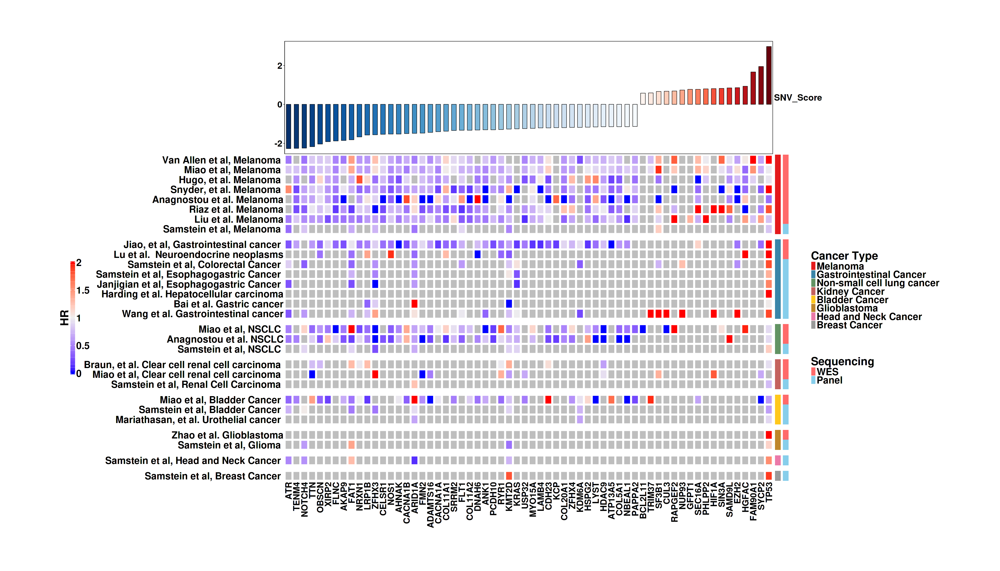

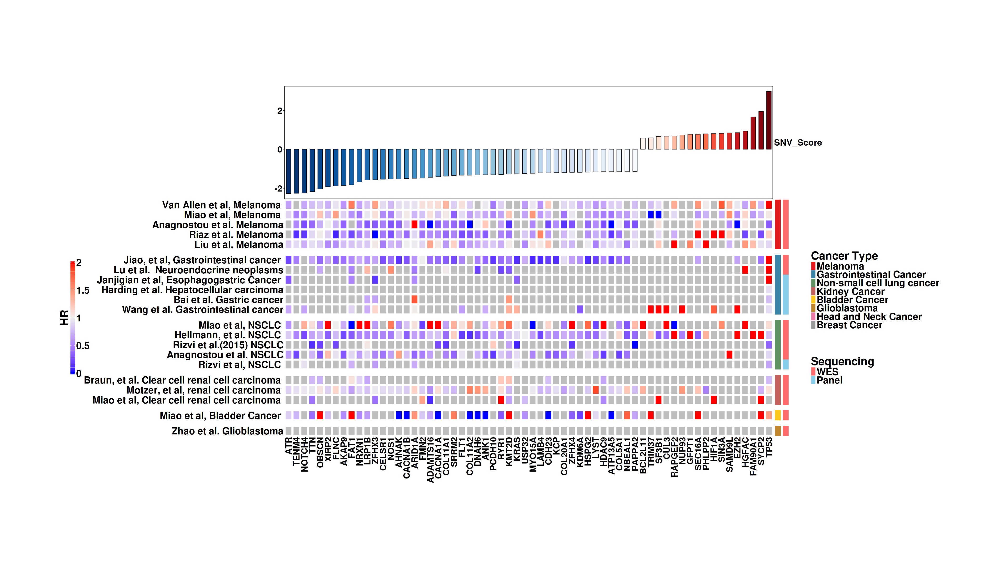

In [36]:
# 这是OS和PFS的NSVscore合并后排序筛选出来的基因热图
options(repr.plot.height = 20, repr.plot.width = 35)
plot_complexheatmap(C,OS_combind,"OS",45,17)
plot_complexheatmap(C,PFS_combind,"PFS",45,17)

In [37]:
# pdf("Artical_Figure2/Figure 1/SNVSCORE_single_gene1.OS.new.pdf",width = 33,height = 20)
# plot_complexheatmap(C,OS_combind,"OS",45,17)
# dev.off()

# pdf("Artical_Figure2/Figure 1/SNVSCORE_single_gene1.PFS.new.pdf",width = 33,height = 20)
# plot_complexheatmap(C,PFS_combind,"PFS",45,17)
# dev.off()

png 
  2

png 
  2

In [37]:
plot_complexheatmap2 = function(C,OS_combind,PFS_combind,favor_num,unfavor_num){
    
    library(ComplexHeatmap)

    n1 = favor_num
    n2 = unfavor_num
    n2 = n2-1

    total_meta = vector()
    total_hm = vector()

    HR_matrix = reshape2::dcast(data = OS_combind[,c("dataset","HR(OS)","gene")],formula = dataset~gene,value.var = "HR(OS)")
    rownames(HR_matrix) = HR_matrix$dataset
    HR_matrix$dataset = NULL

    HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
    rownames(HR_matrix) = datasets_names[rownames(HR_matrix),] 

    meta = datasets_overview[ datasets_overview$Cohort_name %in% rownames(HR_matrix),]
    rownames(meta) = paste(meta$Cohort_name,"(","OS",")",sep="")
    meta = meta[,c("Cancer_type","Immune_checkpoint_blockade","Sequencing","Cancer_type2")]
    meta$Survival = "OS"
    total_meta = rbind(total_meta,meta)

    rownames(HR_matrix) = paste(rownames(HR_matrix),"(","OS",")",sep="")
    hm = HR_matrix[ ,c(names(C)[1:n1],names(C)[(length(C)-n2):length(C)])]
    hm[ hm > 2 ] = 2
    hm = hm[order(meta$Sequencing,decreasing = T),]
    total_hm = rbind(total_hm,hm)


    HR_matrix = reshape2::dcast(data = PFS_combind[,c("dataset","HR(PFS)","gene")],formula = dataset~gene,value.var = "HR(PFS)")
    rownames(HR_matrix) = HR_matrix$dataset
    HR_matrix$dataset = NULL

    HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
    rownames(HR_matrix) = datasets_names[rownames(HR_matrix),] 

    meta = datasets_overview[ datasets_overview$Cohort_name %in% rownames(HR_matrix),]
    rownames(meta) = paste(meta$Cohort_name,"(","PFS",")",sep="")
    meta = meta[,c("Cancer_type","Immune_checkpoint_blockade","Sequencing","Cancer_type2")]
    meta$Survival = "PFS"
    total_meta = rbind(total_meta,meta)

    rownames(HR_matrix) = paste(rownames(HR_matrix),"(","PFS",")",sep="")
    hm = HR_matrix[ ,c(names(C)[1:n1],names(C)[(length(C)-n2):length(C)])]
    hm[ hm > 2 ] = 2
    hm = hm[order(meta$Sequencing,decreasing = T),]
    total_hm = rbind(total_hm,hm)

    total_meta = total_meta[order(total_meta$Survival,decreasing = F),]
    total_meta = total_meta[order(total_meta$Sequencing,decreasing = T),]
    total_hm = total_hm[rownames(total_meta),]


    cancer_type =  c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                     "Glioblastoma","Head and Neck Cancer",
                     "Breast Cancer")
    
    a = colorRampPalette(RColorBrewer::brewer.pal(9,"Set1"))(8)
    names(a) = cancer_type

    row_ha1 = HeatmapAnnotation(
        show_legend = F,
        which = "row",
        CancerType=total_meta[rownames(total_hm),"Cancer_type2"],
        col = list(CancerType = a),
        show_annotation_name = F,
        annotation_legend_param  = list(
                                            title = "Cancer_Type", legend_height = unit(8, "cm"),
                                            title_gp = gpar(fontsize = 18,fontface = "bold"),
                                            labels_gp = gpar(fontsize = 18,fontface = "bold"),
                                            title_position = "leftcenter-rot"
                                       )

    )
    row_ha2 = HeatmapAnnotation(
        show_legend = F,
        which = "row",
        Sequencing=factor(total_meta[rownames(total_hm),"Sequencing"],levels = c("WES","Panel")),
        col = list(Sequencing = c("WES"="indianred1","Panel"="skyblue")),
        show_annotation_name = F,
        annotation_legend_param  = list(
                                            title = "Sequencing", legend_height = unit(8, "cm"),
                                            title_gp = gpar(fontsize = 18,fontface = "bold"),
                                            labels_gp = gpar(fontsize = 18,fontface = "bold"),
                                            title_position = "leftcenter-rot"
                                       )

    )

    row_ha3 = HeatmapAnnotation(
        show_legend = F,
        which = "row",
        Survival=factor(total_meta[rownames(total_hm),"Survival"],levels = c("OS","PFS")),
        col = list(Survival = c("OS"="#BEB8DC","PFS"="#8ECFC9")),
        show_annotation_name = F,
        annotation_legend_param  = list(
                                            title = "Survival", legend_height = unit(8, "cm"),
                                            title_gp = gpar(fontsize = 18,fontface = "bold"),
                                            labels_gp = gpar(fontsize = 18,fontface = "bold"),
                                            title_position = "leftcenter-rot"
                                       )

    )

ht = Heatmap(as.matrix(total_hm),width = ncol(total_hm)*unit(7, "mm"),height = nrow(total_hm)*unit(10, "mm"),
    #              heatmap_height = unit(20,"cm"),
    #              heatmap_width = unit(40,"cm"),
                 row_names_side = "left",
                 column_names_side = "bottom",
                 heatmap_legend_param = list(title = "HR", legend_height = unit(10, "cm"),
                                            title_gp = gpar(fontsize = 28,fontface = "bold"),
                                            labels_gp = gpar(fontsize = 24,fontface = "bold"),
                                            title_position = "leftcenter-rot"
        #                                     at = c( 0,0.25,0.5,0.75, 1)
                                           ),
    #              left_annotation = row_ha2,
    #              right_annotation = row_ha1,
                 top_annotation = HeatmapAnnotation(SNV_Score = anno_barplot(C[colnames(total_hm)],
                                                                             axis_param = list(side = "left",
                                                                                               gp = gpar(fontsize = 22,fontface = "bold")),
                                                                              gp = gpar(fill = c(colorRampPalette(rev(RColorBrewer::brewer.pal(n =9,name = "Blues")))(n1),
                                                                                                 colorRampPalette(RColorBrewer::brewer.pal(n =9,name = "Reds"))(n2+1)
                                                                                                )
                                                                                       )
                                                                     ),
                                                    annotation_name_gp = gpar(fontsize = 22,fontface = "bold"),
                                                    height = unit(10, "cm"),
                                                    show_annotation_name = T),
                  
#                  row_split = factor(meta[rownames(hm),"Cancer_type2"],levels = c("Melanoma","Gastrointestinal Cancer","Urothelial Cancer","Renal Cell Carcinoma",
#                                                                                 "Non-small cell lung cancer","Glioblastoma","Hepatocellular carcinoma","Head and Neck Cancer","Breast Cancer","Pan-cancer")),
                 row_split = factor(total_meta[rownames(total_hm),"Cancer_type2"],levels = c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                                                                                "Glioblastoma","Head and Neck Cancer","Breast Cancer")),
                 row_title = NULL,
                 row_gap = unit(5, "mm"),
                 row_names_max_width = max_text_width(rownames(hm),gp = gpar(fontsize = 12)),
                 column_names_max_height = max_text_width(colnames(hm),gp = gpar(cex = 22)),
                 row_names_gp = gpar(fontface = "bold",cex = 2),
                 column_names_gp = gpar(fontface = "bold",cex = 1.8),
    #         col = colorRamp2(c( 0,0.25,0.5,0.75, 1), c("#FFFFE5","#C7E9B4", "#41B6C4","#225EA8","#081D58")),
            cluster_rows = F,
            cluster_columns = F,
            rect_gp = gpar(col = "white", lwd = 5)
           )


    l1 =  Legend(
            labels = cancer_type,
            title = "Cancer Type",
            legend_gp = gpar(fill = a,fontsize = 20),
            title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
            labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )
    l2 = Legend(
            labels = c("WES","Panel"),
            title = "Sequencing",
            legend_gp = gpar(fill = c("indianred1","skyblue"),fontsize = 20),
            title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
            labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )

    l3 = Legend(
                labels = c("OS","PFS"),
                title = "Survival",
                legend_gp = gpar(fill = c("#BEB8DC","#8ECFC9"),fontsize = 20),
                title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
                labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )
    options(repr.plot.height = 30, repr.plot.width = 40)

    ht_opt$HEATMAP_LEGEND_PADDING = unit(9, "cm")
    ht_opt$ANNOTATION_LEGEND_PADDING = unit(2, "cm")
    draw(ht+row_ha1+row_ha2+row_ha3,
         heatmap_legend_side ="left",
         annotation_legend_side = "right",
         annotation_legend_list = packLegend(l1,l2,l3,row_gap = unit(2.5,"cm"),gap = unit(2.5,"cm"))
        )

    
    
}

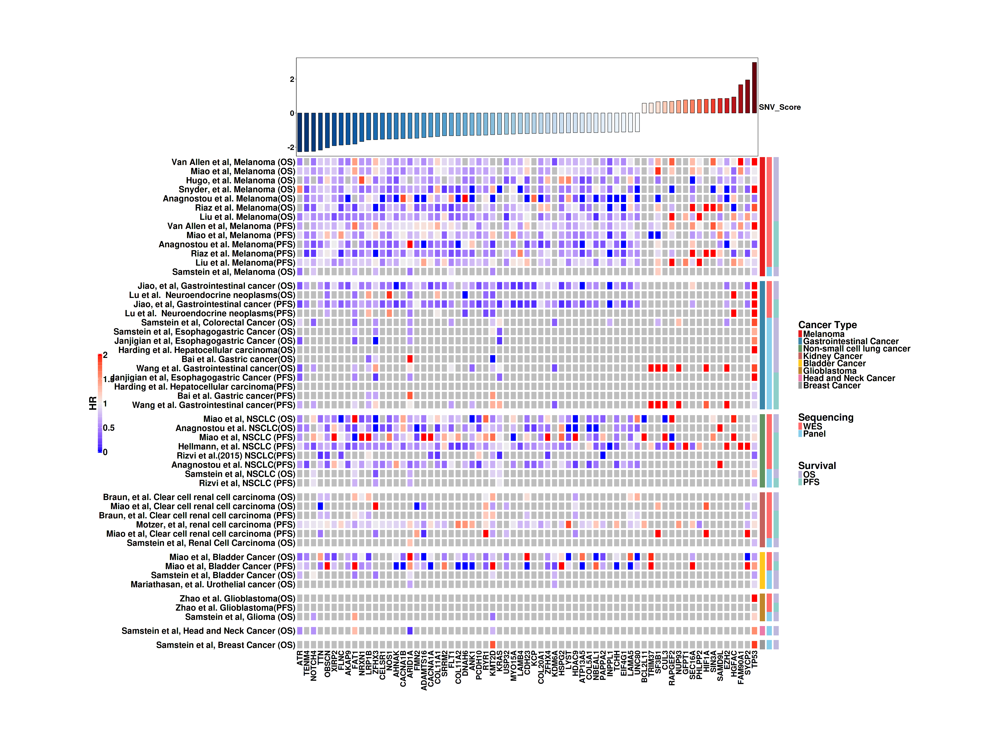

In [38]:
plot_complexheatmap2(C = C,OS_combind = OS_combind,PFS_combind = PFS_combind,favor_num = 50,unfavor_num = 17)

In [40]:
# pdf("Artical_Figure2/Figure 1/SNVSCORE_single_gene1.pdf",width = 33,height = 30)
# plot_complexheatmap2(C = C,OS_combind = OS_combind,PFS_combind = PFS_combind,favor_num = 45,unfavor_num = 17)
# dev.off()

png 
  2

### oncoprint

In [39]:
library(circlize)
plot_complexheatmap2 = function(C,OS_combind,PFS_combind,favor_num,unfavor_num){
    
    library(ComplexHeatmap)

    n1 = favor_num
    n2 = unfavor_num
    n2 = n2-1
    
    cancer_type =  c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                     "Glioblastoma","Head and Neck Cancer","Breast Cancer")

#     total_meta = vector()
    total_hm = list()

    HR_matrix = reshape2::dcast(data = OS_combind[,c("dataset","HR(OS)","gene")],formula = dataset~gene,value.var = "HR(OS)")
    rownames(HR_matrix) = HR_matrix$dataset
    HR_matrix$dataset = NULL
    HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
    rownames(HR_matrix) = datasets_names[rownames(HR_matrix),] 
    hm = HR_matrix[ ,c(names(C)[1:n1],names(C)[(length(C)-n2):length(C)])]
    hm[ hm > 2 ] = 2
    total_hm[["OS"]] = hm


    HR_matrix = reshape2::dcast(data = PFS_combind[,c("dataset","HR(PFS)","gene")],formula = dataset~gene,value.var = "HR(PFS)")
    rownames(HR_matrix) = HR_matrix$dataset
    HR_matrix$dataset = NULL
    HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
    rownames(HR_matrix) = datasets_names[rownames(HR_matrix),] 
    hm = HR_matrix[ ,c(names(C)[1:n1],names(C)[(length(C)-n2):length(C)])]
    hm[ hm > 2 ] = 2
    total_hm[["PFS"]] = hm

    total_hm$OS[setdiff(rownames(total_hm$PFS),rownames(total_hm$OS)),] = NA
    total_hm$PFS[setdiff(rownames(total_hm$OS),rownames(total_hm$PFS)),] = NA
    
    share_dn = intersect(rownames(total_hm$OS),rownames(total_hm$PFS))
    rownames(datasets_overview) = datasets_overview$Cohort_name
    newmeta = datasets_overview[share_dn,]
    newmeta = newmeta[ order(newmeta$Sequencing,decreasing = T),]
    newmeta$Cancer_type2 = factor(newmeta$Cancer_type2 ,levels = cancer_type)
    newmeta = newmeta[ order(newmeta$Cancer_type2),]
    
    total_hm$OS = total_hm$OS[ newmeta$Cohort_name,]
    total_hm$PFS = total_hm$PFS[ newmeta$Cohort_name,]
    
    total_hm$OS = as.matrix(total_hm$OS)
    total_hm$PFS = as.matrix(total_hm$PFS)
    
    HR_values = total_hm
    survival_type = total_hm
    
    survival_type$OS[! is.na(survival_type$OS ) ] = 1
    survival_type$OS[ is.na(survival_type$OS ) ] = 0
    survival_type$PFS[! is.na(survival_type$PFS ) ] = 1
    survival_type$PFS[ is.na(survival_type$PFS ) ] = 0
    
    color_mapping <- colorRamp2(c(0,1,2), c("blue","white", "red"))
    
    a = colorRampPalette(RColorBrewer::brewer.pal(9,"Set1"))(8)
    names(a) = cancer_type

    row_ha1 = HeatmapAnnotation(
            simple_anno_size = unit(3, "cm"),
            show_legend = F,
            which = "row",
            CancerType=newmeta[,"Cancer_type2"],
            Sequencing=factor(newmeta[,"Sequencing"],levels = c("WES","Panel")),
            col = list(CancerType = a,Sequencing = c("WES"="indianred1","Panel"="skyblue")),
            show_annotation_name = F,
            border = TRUE,
            gap = unit(2, "mm")

    )
    
    l1 =  Legend(
            labels = cancer_type,
            title = "Cancer Type",
            legend_gp = gpar(fill = a,fontsize = 20),
            title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
            labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )
    l2 = Legend(
                labels = c("WES","Panel"),
                title = "Sequencing",
                legend_gp = gpar(fill = c("indianred1","skyblue"),fontsize = 20),
                title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
                labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
            )
    l3 <- Legend(at = c(0, 1, 2),
                 title_position = "leftcenter-rot",
                 legend_height = unit(10, "cm"),
                 labels = c("0", "1", "2"),
                 title = "HR",
                 col_fun = colorRamp2(c(0, 1, 2), c("blue", "white", "red")),
                 direction = "vertical",
                 legend_gp = gpar(fill = c("indianred1","skyblue"),fontsize = 20),
                 title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
                 labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
                )
    n = 1
    y_all = 0
    i = 0
    j = 0
    total_n = (favor_num+unfavor_num) * length(share_dn)
    ht = oncoPrint(survival_type,show_pct = F,
                   width = (favor_num+unfavor_num)*unit(10, "mm"),
                   height = length(share_dn)*unit(10, "mm"),
                  show_column_names = T,
                  row_order = newmeta$Cohort_name,
                  column_order = c(names(C)[1:n1],names(C)[(length(C)-n2):length(C)]),
                  row_names_side = "left",
                  column_names_side = "bottom",
                  row_names_gp = gpar(fontface = "bold",cex = 2),
                  column_names_gp = gpar(fontface = "bold",cex = 1.8),
                  heatmap_legend_param = list(title = "Clinical Outcome",
                                              direction = "horizontal",
                                              legend_height = unit(10, "cm"),
                                              title_gp = gpar(fontsize = 28,fontface = "bold"),
                                              labels_gp = gpar(fontsize = 24,fontface = "bold"),
                                              title_position = "leftcenter"
                                             ),
                  top_annotation = HeatmapAnnotation(SNV_Score = anno_barplot(C[c(1:n1,(length(C)-n2):length(C))],
                                                                                 axis_param = list(side = "left",
                                                                                                   gp = gpar(fontsize = 22,fontface = "bold")),
                                                                                  gp = gpar(fill = c(colorRampPalette(rev(RColorBrewer::brewer.pal(n =9,name = "Blues")))(n1),
                                                                                                     colorRampPalette(RColorBrewer::brewer.pal(n =9,name = "Reds"))(n2+1)
                                                                                                    )
                                                                                           )
                                                                         ),
                                                        annotation_name_gp = gpar(fontsize = 22,fontface = "bold"),
                                                        height = unit(10, "cm"),
                                                        show_annotation_name = T),
                  right_annotation = row_ha1,
                   row_split = newmeta[,"Cancer_type2"],
                  row_title = NULL,
                  row_gap = unit(2, "mm"),
    #               row_names_max_width = max_text_width(rownames(hm),gp = gpar(fontsize = 12)),
    #               column_names_max_height = max_text_width(colnames(hm),gp = gpar(cex = 22)),
    #               rect_gp = gpar(col = "white", lwd = 5),
                  alter_fun = list(
                                    background = function(x, y, w, h) {

                                        if(n <= 4 | n > total_n+4){ # 这个数字4是跟组别个数有关
                                                                        y_all <<- 0
                                                                        i <<- 0
                                                                        j <<- 0
                                        }else if(!y %in% y_all){
                                                                        y_all <<- y
                                                                        j <<- 1
                                                                        i <<- i + 1
                                        }else if(y %in% y_all){
                                                                        j <<- j + 1
                                                                        if(j > (favor_num+unfavor_num)){
                                                                            j<<- 1
                                                                            i<<- i + 1
                                                                        }
                                        }         
                                        n <<- n + 1

                                        grid.polygon(
                                                unit.c(x - 0.5*w, x - 0.5*w, x + 0.5*w), 
                                                unit.c(y - 0.5*h, y + 0.5*h, y - 0.5*h),
                                                gp = gpar(fill = "grey88", col = "white")
                                        )
                                        grid.polygon(
                                                unit.c(x + 0.5*w, x + 0.5*w, x - 0.5*w), 
                                                unit.c(y + 0.5*h, y - 0.5*h, y + 0.5*h),
                                                gp = gpar(fill = "grey88", col = "white")
                                        )

                                    },
                                    OS = function(x, y, w, h) {

                                        if(i!=0&j!=0&!y_all %in% 0){
                                            v = ifelse(is.na(HR_values$OS[i,j]),"grey88",color_mapping(HR_values$OS[i,j]))
                                            grid.polygon(
                                                unit.c(x - 0.5*w, x - 0.5*w, x + 0.5*w), 
                                                unit.c(y - 0.5*h, y + 0.5*h, y - 0.5*h),
                                                gp = gpar(fill = v, col = "white")
                                            )
                                        }else{ # 这一块是画图例部分的
                                              grid.polygon(
                                                unit.c(x - 0.5*w, x - 0.5*w, x + 0.5*w), 
                                                unit.c(y - 0.5*h, y + 0.5*h, y - 0.5*h),
                                                gp = gpar(fill = "black", col = "white"))
                                          }
                                    },
                                    PFS = function(x, y, w, h) {

                                        if(i!=0&j!=0&!y_all %in% 0){
                                            v = ifelse(is.na(HR_values$PFS[i,j]),"grey88",color_mapping(HR_values$PFS[i,j]))
                                            grid.polygon(
                                                unit.c(x + 0.5*w, x + 0.5*w, x - 0.5*w), 
                                                unit.c(y + 0.5*h, y - 0.5*h, y + 0.5*h),
                                                gp = gpar(fill =v, col = "white"))
                                        }else{ # 这一块是画图例部分的
                                              grid.polygon(
                                                unit.c(x + 0.5*w, x + 0.5*w, x - 0.5*w), 
                                                unit.c(y + 0.5*h, y - 0.5*h, y + 0.5*h),
                                                gp = gpar(fill ="black", col = "white"))
                                          }

                                    }
                  )


                  )

    options(repr.plot.height = 20, repr.plot.width = 35)
    ht_opt$HEATMAP_LEGEND_PADDING = unit(1, "cm")
    ht_opt$ANNOTATION_LEGEND_PADDING = unit(2, "cm")
    draw(ht,
         heatmap_legend_side ="bottom",
         annotation_legend_side = "right",
         annotation_legend_list = packLegend(l1,l2,l3,row_gap = unit(2.5,"cm"),gap = unit(2.5,"cm"))
            )
    
    
}

circlize version 0.4.14
CRAN page: https://cran.r-project.org/package=circlize
Github page: https://github.com/jokergoo/circlize
Documentation: https://jokergoo.github.io/circlize_book/book/

If you use it in published research, please cite:
Gu, Z. circlize implements and enhances circular visualization
  in R. Bioinformatics 2014.

This message can be suppressed by:
  suppressPackageStartupMessages(library(circlize))




All mutation types: OS, PFS.

Colors are not defined for: OS, PFS. They won't be shown in the
barplots.



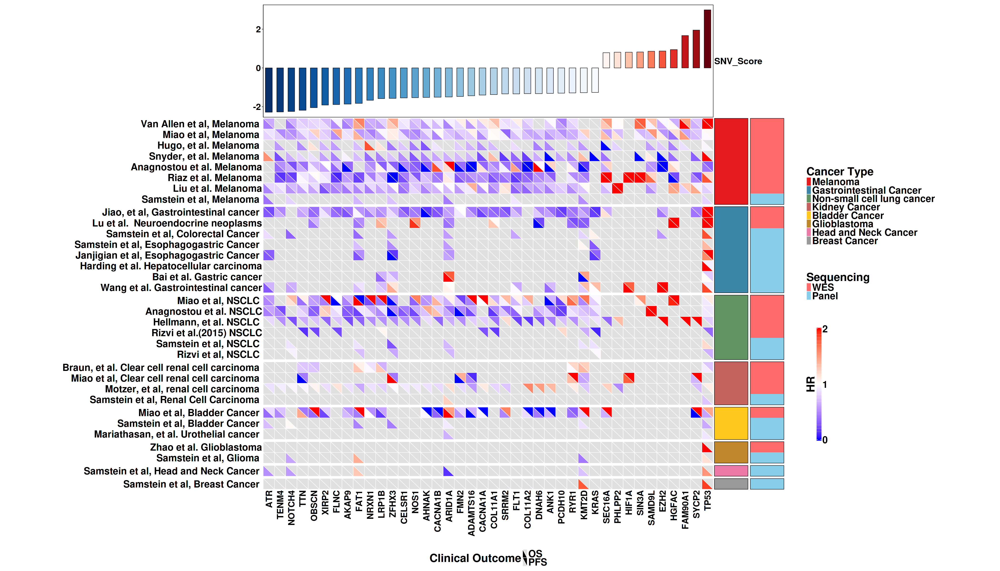

In [40]:
plot_complexheatmap2(C = C,OS_combind = OS_combind,PFS_combind = PFS_combind,favor_num = 30,unfavor_num = 10)

In [41]:
pdf("Artical_Figure2/Figure 1/SNVSCORE_single_gene1.pdf",width = 35,height = 20)
plot_complexheatmap2(C = C,OS_combind = OS_combind,PFS_combind = PFS_combind,favor_num = 30,unfavor_num = 10)
dev.off()

All mutation types: OS, PFS.

Colors are not defined for: OS, PFS. They won't be shown in the
barplots.



png 
  2

### 突变频率

In [42]:
# 前面这部分的总结会让个别基因在个别数据集中突变频率太低而被舍弃，导致信息丢失，这里不再过滤基因
ref_single_significant2 = list()

for(i in names(ref_single_OS)){
        tmp2 = ref_single_OS[[i]]
#         less_num = floor(unique(rowSums(tmp2[,c("Patient(Mutation)","Patient(Wildtype)")])) * 0.05) # 两个组至少包含的患者数是总人数的5%
#         if(less_num <3){less_num = 3}
#         tmp2 = tmp2[ tmp2$`Patient(Mutation)` >= less_num & tmp2$`Patient(Wildtype)` >= less_num,]
#         tmp = tmp[ tmp$`Log_rank_test(OS)`<0.05 | tmp$`Wald_test(OS)` < 0.05,]  # 筛选P值小于0.05
        if(nrow(tmp2) != 0){
            tmp2$dataset = i
            tmp2$Cancer_type = datasets_overview[i,"Cancer_type"]
            tmp2$Cancer_type2 = datasets_overview[i,"Cancer_type2"]
            tmp2$gene = rownames(tmp2)
        }  
        ref_single_significant2[[i]] = tmp2
}

# 这里已经将dataset1 和 dataset3 去除了
tmp2 = vector()
for(i in names(ref_single_significant2)){
    if(!i %in%  c("dataset1","dataset3","dataset6") & nrow(ref_single_significant2[[i]]) != 0){
        tmp2 = rbind(tmp2,ref_single_significant2[[i]])
    }
    
}

In [43]:
pat_mut_num = reshape2::dcast(tmp2,dataset~gene,value.var = "Patient(Mutation)",fill = 0)
rownames(pat_mut_num) = pat_mut_num$dataset
pat_mut_num$dataset = NULL
pat_mut_num = pat_mut_num[rownames(datasets_overview)[ rownames(datasets_overview) %in% rownames(pat_mut_num)],]
pat_mut_num$Cohort_size = datasets_overview[rownames(pat_mut_num),"Cohort_size"]
pat_mut_num$Sequencing = datasets_overview[rownames(pat_mut_num),"Sequencing"]
rownames(pat_mut_num) = datasets_overview[rownames(pat_mut_num),"Cohort_name"]

Loading required package: viridisLite



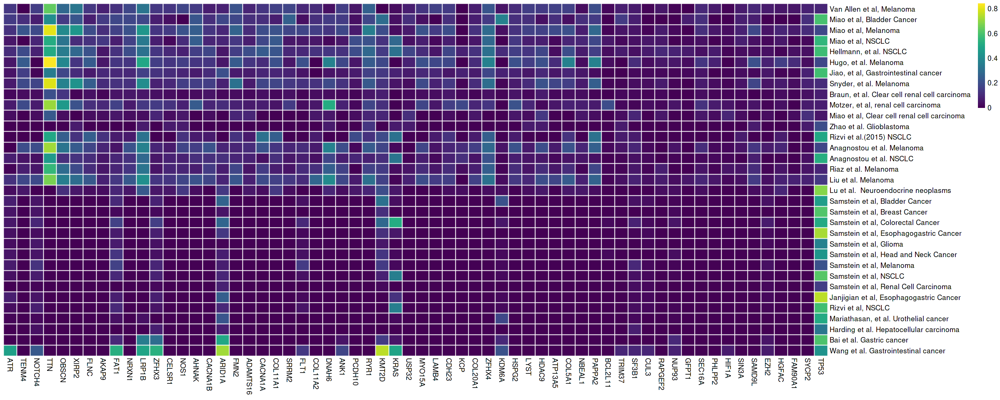

In [44]:
pat_mut_pro = pat_mut_num[,1:(ncol(pat_mut_num)-2)]/pat_mut_num$Cohort_size
pat_mut_pro = pat_mut_pro[,c(names(C)[1:45],names(C)[(length(C)-16):length(C)])]

meta = datasets_overview[ datasets_overview$Cohort_name %in% rownames(pat_mut_pro),]
rownames(meta) = meta$Cohort_name
meta = meta[,c("Cancer_type","Immune_checkpoint_blockade","Sequencing","Cancer_type2")]

meta = meta[ order(meta$Sequencing,decreasing = T),]
pat_mut_pro = pat_mut_pro[ rownames(meta),]
pat_mut_num = pat_mut_num[ rownames(meta),]

library(viridis )
options(repr.plot.height = 8, repr.plot.width = 20)
pheatmap::pheatmap(pat_mut_pro,
                   cluster_rows = F,
                   cluster_cols = F,
                   color = viridis::viridis(100),
#                    cellwidth = 16,
#                    cellheight = 20,
                   border_color = "white")

In [48]:
library(circlize)
# cancer_type的顺序是按照数据集个数排列的
# cancer_type =  c("Melanoma","Gastrointestinal Cancer","Urothelial Cancer","Renal Cell Carcinoma",
#                      "Non-small cell lung cancer","Glioblastoma","Hepatocellular carcinoma","Head and Neck Cancer",
#                      "Breast Cancer","Pan-cancer")
cancer_type =  c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                     "Glioblastoma","Head and Neck Cancer",
                     "Breast Cancer")
# a = colorRampPalette(RColorBrewer::brewer.pal(9,"Set1"))(10)
a = colorRampPalette(RColorBrewer::brewer.pal(9,"Set1"))(8)
names(a) = cancer_type

row_ha1 = HeatmapAnnotation(
        show_legend = F,
        which = "row",
        CancerType=meta[rownames(pat_mut_pro),"Cancer_type2"],
        col = list(CancerType = a),
        show_annotation_name = F,
        annotation_legend_param  = list(
                                            title = "Cancer_Type", legend_height = unit(8, "cm"),
                                            title_gp = gpar(fontsize = 18,fontface = "bold"),
                                            labels_gp = gpar(fontsize = 18,fontface = "bold"),
                                            title_position = "leftcenter-rot"
                                       )

    )
row_ha2 = HeatmapAnnotation(
        show_legend = F,
        which = "row",
        Sequencing=factor(meta[rownames(pat_mut_pro),"Sequencing"],levels = c("WES","Panel")),
        col = list(Sequencing = c("WES"="indianred1","Panel"="skyblue")),
        show_annotation_name = F,
        annotation_legend_param  = list(
                                            title = "Sequencing", legend_height = unit(8, "cm"),
                                            title_gp = gpar(fontsize = 18,fontface = "bold"),
                                            labels_gp = gpar(fontsize = 18,fontface = "bold"),
                                            title_position = "leftcenter-rot"
                                       )

    )


ht = Heatmap(as.matrix(pat_mut_pro),width = ncol(pat_mut_pro)*unit(9, "mm"),height = nrow(pat_mut_pro)*unit(10, "mm"),
#              heatmap_height = unit(20,"cm"),
#              heatmap_width = unit(50,"cm"),
             row_names_side = "left",
             column_names_side = "bottom",
#              row_split = factor(meta[rownames(hm),"Cancer_type2"],levels = c("Melanoma","Gastrointestinal Cancer","Urothelial Cancer","Renal Cell Carcinoma",
#                                                                                 "Non-small cell lung cancer","Glioblastoma","Hepatocellular carcinoma","Head and Neck Cancer","Breast Cancer","Pan-cancer")),
             row_split = factor(meta[rownames(pat_mut_pro),"Cancer_type2"],levels = c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                                                                                "Glioblastoma","Head and Neck Cancer","Breast Cancer")),
#              row_split = factor(pat_mut_num$Sequencing,levels = c("WES","Panel")),
             row_title = NULL,
             row_gap = unit(5, "mm"),
             row_names_max_width = max_text_width(rownames(hm),gp = gpar(fontsize = 12)),
             column_names_max_height = max_text_width(colnames(hm),gp = gpar(cex = 22)),
             row_names_gp = gpar(fontface = "bold",cex = 2),
             column_names_gp = gpar(fontface = "bold",cex = 1.8),
        heatmap_legend_param = list(title = "Proportion of positive patients", legend_height = unit(8, "cm"),
                                    title_gp = gpar(fontsize = 28,fontface = "bold"),
                                    labels_gp = gpar(fontsize = 24,fontface = "bold"),
                                    title_position = "leftcenter-rot",
                                    at = c( 0,0.5, 1)),
        col = colorRamp2(c( 0,0.25,0.5,0.75, 1), c("#FFFFE5","#C7E9B4", "#41B6C4","#225EA8","#081D58")),
        cluster_rows = F,
        cluster_columns = F,
        rect_gp = gpar(col = "grey88", lwd = 5),
        layer_fun = function(j, i, x, y, w, h, fill){
            v = pindex(as.matrix(pat_mut_num[,colnames(pat_mut_pro)]), i, j)
            grid.text(v,x, y,gp = gpar(fontsize = 12,col="black"))
        }
       )

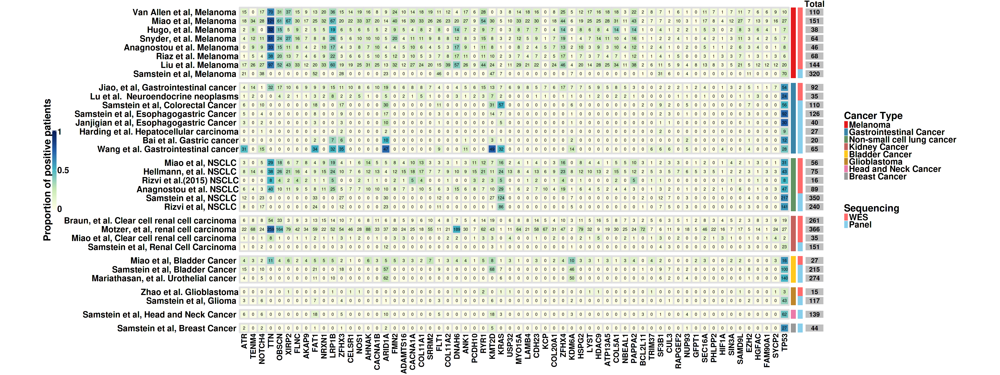

In [49]:
tn = pat_mut_num$Cohort_size
names(tn) = rownames(pat_mut_num)
n = nrow(pat_mut_pro)

ha = Heatmap(tn,
             row_names_side = "left",
#              row_names_gp = gpar(fontface = "bold",cex = 1.5),
#              row_names_max_width = max_text_width(rownames(hm),gp = gpar(fontsize = 12)),
             column_names_centered = T,
             show_heatmap_legend = F,
             width = unit(2, "cm"),
             column_names_gp = gpar(fontface = "bold",cex = 2,angle = 45),
             rect_gp = gpar(col = "white", lwd = 5),
             name = "Total",
             col = rep("gray",n),
             column_names_rot =0,
             cluster_rows = F,
             column_names_side = "top",
             cell_fun = function(j, i, x, y, width, height, fill){
               
               grid.text( as.matrix(tn)[i, j], x, y, gp = gpar(fontsize =18,fontface="bold"))
               
             }
            )

# options(repr.plot.height = 12, repr.plot.width = 34)
# ht_opt$HEATMAP_LEGEND_PADDING = unit(3.5, "cm")
# draw(ht+ha,heatmap_legend_side ="left")

    l1 =  Legend(
            labels = cancer_type,
            title = "Cancer Type",
            legend_gp = gpar(fill = a,fontsize = 20),
            title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
            labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )
    l2 = Legend(
            labels = c("WES","Panel"),
            title = "Sequencing",
            legend_gp = gpar(fill = c("indianred1","skyblue"),fontsize = 20),
            title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
            labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )

    options(repr.plot.height = 15, repr.plot.width = 40)

    ht_opt$HEATMAP_LEGEND_PADDING = unit(9, "cm")
    ht_opt$ANNOTATION_LEGEND_PADDING = unit(2, "cm")
    draw(ht+row_ha1+row_ha2+ha,
         heatmap_legend_side ="left",
         annotation_legend_side = "right",
         annotation_legend_list = packLegend(l1,l2,row_gap = unit(2.5,"cm"),gap = unit(2.5,"cm"))
        )

In [50]:
pdf("Artical_Figure2/Figure 1/SNVSCORE_single_gene2.pdf",width = 40,height = 25)
    ht_opt$HEATMAP_LEGEND_PADDING = unit(9, "cm")
    ht_opt$ANNOTATION_LEGEND_PADDING = unit(2, "cm")
    draw(ht+row_ha1+row_ha2+ha,
         heatmap_legend_side ="left",
         annotation_legend_side = "right",
         annotation_legend_list = packLegend(l1,l2,row_gap = unit(2.5,"cm"),gap = unit(2.5,"cm"))
        )
dev.off()

png 
  2

### TCGA泛癌层面的突变频率

In [50]:
library(maftools)

In [51]:
maf1 = read.maf("/home/ncpsb/new_mnt/Other/jx/web/data/TCGA(panacanalt)/mc3.v0.2.8.PUBLIC.maf",isTCGA = F,useAll = T,removeDuplicatedVariants = T)

TCGA_PanCancer = readRDS("/srv/shiny-server/SNVIO_V10.1/data/TCGA/panacanlt_TCGA_log2.rds")
pathway_list = readRDS("/srv/shiny-server/SNVIO_V10.1/data/all_pathway.rds")

-Reading
-Validating
--Removed 149782 duplicated variants
-Silent variants: 1288245 
-Summarizing
--Possible FLAGS among top ten genes:
  TTN
  MUC16
  SYNE1
  FLG
  USH2A
-Processing clinical data
--Missing clinical data
-Finished in 00:05:05 elapsed (00:05:15 cpu) 


In [52]:
# 第一步：将所有瘤种的补体突变患者和野生型患者区分开来
TCGA_cohort_cal_pm = function(TCGA,cancer_type,gene,Mut_type,Wild_type){
  if("All" %in% Mut_type){
    mut = unique(as.character(TCGA[[cancer_type]]$maf@data$Tumor_Sample_Barcode[
      TCGA[[cancer_type]]$maf@data$Hugo_Symbol %in% pathway_list[[gene]]
    ]))
  }else{
    mut = unique(as.character(TCGA[[cancer_type]]$maf@data$Tumor_Sample_Barcode[
      TCGA[[cancer_type]]$maf@data$Hugo_Symbol %in% pathway_list[[gene]] &
        TCGA[[cancer_type]]$maf@data$Variant_Classification %in% Mut_type
    ]))
  }
  
  if(Wild_type == "Others"){
    wt = setdiff(x = unique(as.character(TCGA[[cancer_type]]$maf@data$Tumor_Sample_Barcode)),mut) 
  }else{
    wt = setdiff(x = unique(as.character(TCGA[[cancer_type]]$maf@data$Tumor_Sample_Barcode)),
                 unique(as.character(TCGA[[cancer_type]]$maf@data$Tumor_Sample_Barcode[TCGA[[cancer_type]]$maf@data$Hugo_Symbol %in% pathway_list[[gene]]])))
  }
  return(list("mut" = mut,"wt" = wt))
}

In [53]:
anno = vector()
for(i in names(TCGA_PanCancer)){
    tmp_cohort = TCGA_cohort_cal_pm(TCGA_PanCancer,i,"GOBP_REGULATION_OF_COMPLEMENT_ACTIVATION","All","Others")
    tmp_mut = tmp_cohort$mut
    tmp_wt = tmp_cohort$wt
    anno = rbind(anno,data.frame(Patient=tmp_mut,Cancer_Type=rep(i,length(tmp_mut)),Complement=rep("Mutation",length(tmp_mut))))
    anno = rbind(anno,data.frame(Patient=tmp_wt,Cancer_Type=rep(i,length(tmp_wt)),Complement=rep("Wildtype",length(tmp_wt))))
    
}
rownames(anno) = anno$Patient
anno$Patient = NULL
anno$Tumor_Sample_Barcode = rownames(anno)

In [54]:
total_maf_matrix = maf1@data
total_maf_matrix$Tumor_Sample_Barcode = gsub(pattern = "(TCGA-..-....)-.*",replacement = "\\1",x = maf1@data$Tumor_Sample_Barcode)

maf2 = read.maf(total_maf_matrix)
tmp_maf = subsetMaf(maf = maf2,tsb = rownames(anno))

-Validating
--Removed 2296 duplicated variants
-Summarizing
--Possible FLAGS among top ten genes:
  TTN
  MUC16
  SYNE1
  FLG
  USH2A
-Processing clinical data
--Missing clinical data
-Finished in 00:03:19 elapsed (00:03:20 cpu) 


In [55]:
# pdf(file = "Artical_Figure2/Figure 1/SNVSCORE_single_gene3.pdf",width = 20,height = 20)
# oncoplot(maf = tmp_maf,bgCol = "white",
#                    borderCol = NULL,
#                    legendFontSize = 2,
#                    gene_mar = 8,
#                    removeNonMutated = FALSE,
#                    legend_height=6,
#                    fontSize = 1.2,
# #                    annotationColor = tl,
#                    annotationFontSize = 2,
#                    annotationDat = anno,
#                    clinicalFeatures = c("Cancer_Type"),
# #                    sortByAnnotation = T,
#                    genes = c(names(C)[1:45],names(C)[(length(C)-16):length(C)])
#                    )
# dev.off()

png 
  2

### 单瘤种预后价值基因

In [51]:
library(circlize)
plot_complexheatmap3 = function(C,OS_combind,PFS_combind,nGene){
    
    library(ComplexHeatmap)
    cancer_type =  c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                         "Glioblastoma","Head and Neck Cancer","Breast Cancer")
    Cancer_specific_genes = vector()
    for(i in cancer_type){
        tmp_A = RS_matrix_OS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
        tmp_B = RS_matrix_PFS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
        tmp_A[is.na(tmp_A)] = 0
        tmp_B[is.na(tmp_B)] = 0

        tmp_C = tmp_A+tmp_B
        names(tmp_C) = unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS)))

        tmp_C = sort(tmp_C)

       Cancer_specific_genes = c(Cancer_specific_genes,names(tmp_C)[1:nGene]) #前十个
    }
    

#     total_meta = vector()
    total_hm = list()

    HR_matrix = reshape2::dcast(data = OS_combind[,c("dataset","HR(OS)","gene")],formula = dataset~gene,value.var = "HR(OS)")
    rownames(HR_matrix) = HR_matrix$dataset
    HR_matrix$dataset = NULL
    HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
    rownames(HR_matrix) = datasets_names[rownames(HR_matrix),] 
    hm = as.matrix(HR_matrix)[ ,Cancer_specific_genes]
    hm[ hm > 2 ] = 2
    total_hm[["OS"]] = hm


    HR_matrix = reshape2::dcast(data = PFS_combind[,c("dataset","HR(PFS)","gene")],formula = dataset~gene,value.var = "HR(PFS)")
    rownames(HR_matrix) = HR_matrix$dataset
    HR_matrix$dataset = NULL
    HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
    rownames(HR_matrix) = datasets_names[rownames(HR_matrix),] 
    hm = as.matrix(HR_matrix)[ ,Cancer_specific_genes]
    hm[ hm > 2 ] = 2
    total_hm[["PFS"]] = hm

    OP = setdiff(rownames(total_hm$PFS),rownames(total_hm$OS))
    OP_matrix = matrix(rep(NA,length(OP)*nGene*length(cancer_type)),nrow = length(OP),ncol = nGene*length(cancer_type))
    rownames(OP_matrix) = OP
    total_hm$OS = rbind(total_hm$OS,OP_matrix)
    
    OO = setdiff(rownames(total_hm$OS),rownames(total_hm$PFS))
    OO_matrix = matrix(rep(NA,length(OO)*nGene*length(cancer_type)),nrow = length(OO),ncol = nGene*length(cancer_type))
    rownames(OO_matrix) = OO
    total_hm$PFS = rbind(total_hm$PFS,OO_matrix)

    
    
    share_dn = intersect(rownames(total_hm$OS),rownames(total_hm$PFS))
    rownames(datasets_overview) = datasets_overview$Cohort_name
    newmeta = datasets_overview[share_dn,]
    newmeta = newmeta[ order(newmeta$Sequencing,decreasing = T),]
    newmeta$Cancer_type2 = factor(newmeta$Cancer_type2 ,levels = cancer_type)
    newmeta = newmeta[ order(newmeta$Cancer_type2),]
    
    total_hm$OS = total_hm$OS[ newmeta$Cohort_name,]
    total_hm$PFS = total_hm$PFS[ newmeta$Cohort_name,]
    
#     return(total_hm)
    
    HR_values = total_hm
    survival_type = total_hm
    
    survival_type$OS[! is.na(survival_type$OS ) ] = 1
    survival_type$OS[ is.na(survival_type$OS ) ] = 0
    survival_type$PFS[! is.na(survival_type$PFS ) ] = 1
    survival_type$PFS[ is.na(survival_type$PFS ) ] = 0
    
    color_mapping <- colorRamp2(c(0,1,2), c("blue","white", "red"))
    
    a = colorRampPalette(RColorBrewer::brewer.pal(9,"Set1"))(8)
    names(a) = cancer_type

    row_ha1 = HeatmapAnnotation(
            simple_anno_size = unit(2, "cm"),
            show_legend = F,
            which = "row",
            Sequencing=factor(newmeta[,"Sequencing"],levels = c("WES","Panel")),
            CancerType=newmeta[,"Cancer_type2"],
            
            col = list(CancerType = a,Sequencing = c("WES"="indianred1","Panel"="skyblue")),
            show_annotation_name = F,
            border = TRUE,
            gap = unit(2, "mm")

    )
    
    col_ha1 = HeatmapAnnotation(
        show_legend = F,
        which = "column",
        CancerType=unlist(lapply(cancer_type,function(x){rep(x,nGene)})),
        col = list(CancerType = a),
        show_annotation_name = F

    )
    
    l1 =  Legend(
            labels = cancer_type,
            title = "Cancer Type",
            legend_gp = gpar(fill = a,fontsize = 20),
            title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
            labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )
    l2 = Legend(
                labels = c("WES","Panel"),
                title = "Sequencing",
                legend_gp = gpar(fill = c("indianred1","skyblue"),fontsize = 20),
                title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
                labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
            )
    l3 <- Legend(at = c(0, 1, 2),
                 title_position = "leftcenter-rot",
                 legend_height = unit(10, "cm"),
                 labels = c("0", "1", "2"),
                 title = "HR",
                 col_fun = colorRamp2(c(0, 1, 2), c("blue", "white", "red")),
                 direction = "vertical",
                 legend_gp = gpar(fill = c("indianred1","skyblue"),fontsize = 20),
                 title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
                 labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
                )
    n = 1
    y_all = 0
    i = 0
    j = 0
    total_n = (nGene*length(cancer_type)) * length(share_dn)
    ht = oncoPrint(survival_type,show_pct = F,
                   width = (nGene*length(cancer_type))*unit(7, "mm"),
                   height = length(share_dn)*unit(10, "mm"),
                  show_column_names = T,
                  row_order = newmeta$Cohort_name,
                  column_order = Cancer_specific_genes,
                  row_names_side = "left",
                  column_names_side = "bottom",
                  row_names_gp = gpar(fontface = "bold",cex = 2),
                  column_names_gp = gpar(fontface = "bold",cex = 1.8),
                  heatmap_legend_param = list(title = "Clinical Outcome",
                                              direction = "horizontal",
                                              legend_height = unit(10, "cm"),
                                              title_gp = gpar(fontsize = 28,fontface = "bold"),
                                              labels_gp = gpar(fontsize = 24,fontface = "bold"),
                                              title_position = "leftcenter"
                                             ),
#                   top_annotation = col_ha1,
             row_split = newmeta[,"Cancer_type2"],
                  right_annotation = row_ha1,
                  row_title = NULL,
                  row_gap = unit(2, "mm"),
    #               row_names_max_width = max_text_width(rownames(hm),gp = gpar(fontsize = 12)),
    #               column_names_max_height = max_text_width(colnames(hm),gp = gpar(cex = 22)),
    #               rect_gp = gpar(col = "white", lwd = 5),
                  alter_fun = list(
                                    background = function(x, y, w, h) {

                                        if(n <= 4 | n > total_n+4){ # 这个数字4是跟组别个数有关
                                                                        y_all <<- 0
                                                                        i <<- 0
                                                                        j <<- 0
                                        }else if(!y %in% y_all){
                                                                        y_all <<- y
                                                                        j <<- 1
                                                                        i <<- i + 1
                                        }else if(y %in% y_all){
                                                                        j <<- j + 1
                                                                        if(j > (nGene*length(cancer_type))){
                                                                            j<<- 1
                                                                            i<<- i + 1
                                                                        }
                                        }         
                                        n <<- n + 1

                                        grid.polygon(
                                                unit.c(x - 0.5*w, x - 0.5*w, x + 0.5*w), 
                                                unit.c(y - 0.5*h, y + 0.5*h, y - 0.5*h),
                                                gp = gpar(fill = "grey88", col = "white")
                                        )
                                        grid.polygon(
                                                unit.c(x + 0.5*w, x + 0.5*w, x - 0.5*w), 
                                                unit.c(y + 0.5*h, y - 0.5*h, y + 0.5*h),
                                                gp = gpar(fill = "grey88", col = "white")
                                        )

                                    },
                                    OS = function(x, y, w, h) {
                                        
                                        if(i!=0&j!=0&!y_all %in% 0){
                                            v = ifelse(is.na(HR_values$OS[i,j]),"grey88",color_mapping(HR_values$OS[i,j]))
                                            grid.polygon(
                                                unit.c(x - 0.5*w, x - 0.5*w, x + 0.5*w), 
                                                unit.c(y - 0.5*h, y + 0.5*h, y - 0.5*h),
                                                gp = gpar(fill = v, col = "white")
                                            )
                                        }else{ # 这一块是画图例部分的
                                              grid.polygon(
                                                unit.c(x - 0.5*w, x - 0.5*w, x + 0.5*w), 
                                                unit.c(y - 0.5*h, y + 0.5*h, y - 0.5*h),
                                                gp = gpar(fill = "red", col = "white"))
                                          }
                                    },
                                    PFS = function(x, y, w, h) {

                                        if(i!=0&j!=0&!y_all %in% 0){
                                            v = ifelse(is.na(HR_values$PFS[i,j]),"grey88",color_mapping(HR_values$PFS[i,j]))
                                            grid.polygon(
                                                unit.c(x + 0.5*w, x + 0.5*w, x - 0.5*w), 
                                                unit.c(y + 0.5*h, y - 0.5*h, y + 0.5*h),
                                                gp = gpar(fill =v, col = "white"))
                                        }else{ # 这一块是画图例部分的
                                              grid.polygon(
                                                unit.c(x + 0.5*w, x + 0.5*w, x - 0.5*w), 
                                                unit.c(y + 0.5*h, y - 0.5*h, y + 0.5*h),
                                                gp = gpar(fill ="blue", col = "white"))
                                          }

                                    }
                  )


                  )

    options(repr.plot.height = 20, repr.plot.width = 40)
    ht_opt$HEATMAP_LEGEND_PADDING = unit(1, "cm")
    ht_opt$ANNOTATION_LEGEND_PADDING = unit(2, "cm")
    draw(ht,
         heatmap_legend_side ="bottom",
         annotation_legend_side = "right",
         annotation_legend_list = packLegend(l1,l2,l3,row_gap = unit(2.5,"cm"),gap = unit(2.5,"cm"))
            )
    
    
}

All mutation types: OS, PFS.

Colors are not defined for: OS, PFS. They won't be shown in the
barplots.



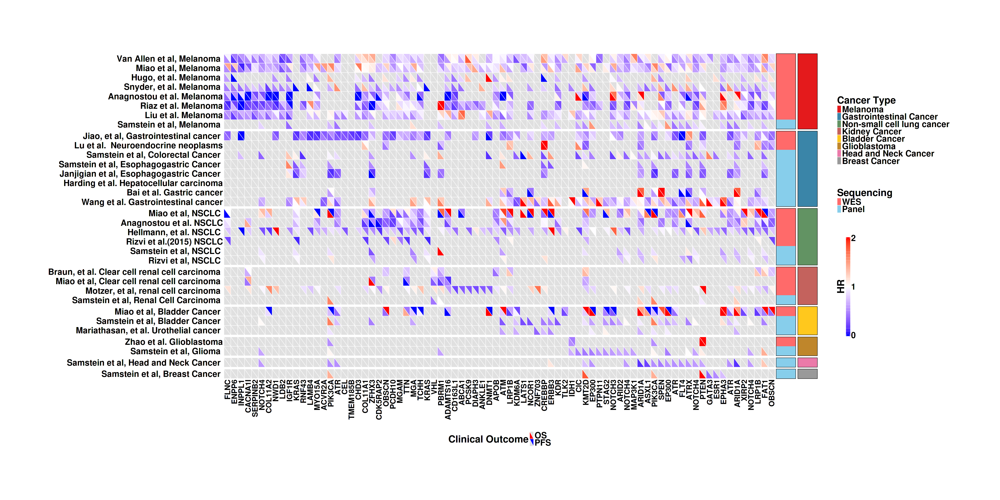

In [52]:
plot_complexheatmap3(C = C,OS_combind = OS_combind,PFS_combind = PFS_combind,nGene = 10)

In [52]:
# pdf("Artical_Figure2/Figure 1/SNVSCORE_single_gene4.new.pdf",width = 40,height = 30)
# plot_complexheatmap3(C = C,OS_combind = OS_combind,PFS_combind = PFS_combind,nGene = 10)
# dev.off()

All mutation types: OS, PFS.

Colors are not defined for: OS, PFS. They won't be shown in the
barplots.



png 
  2

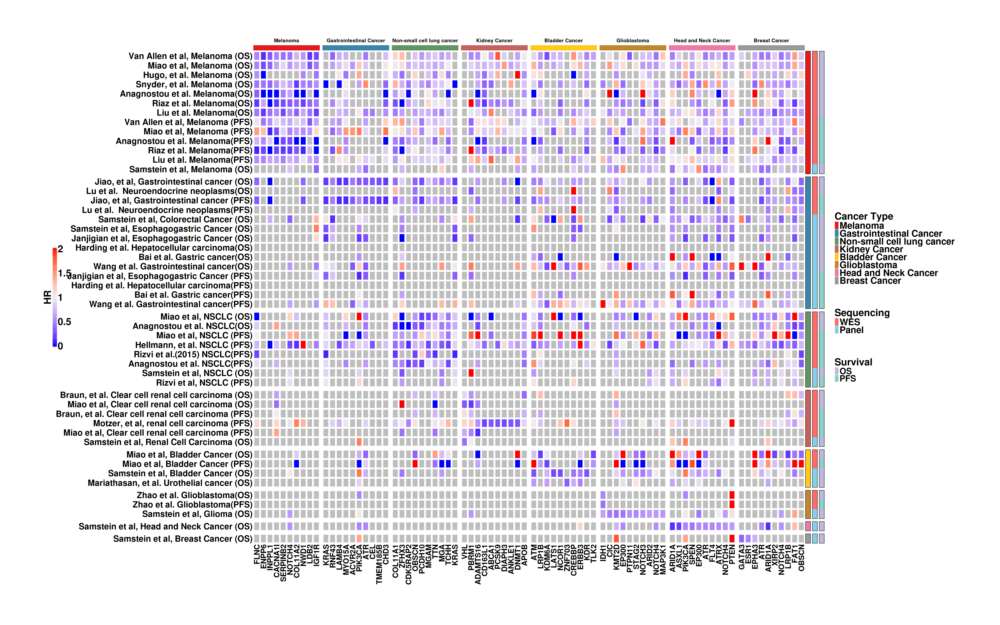

In [53]:
cancer_type =  c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                     "Glioblastoma","Head and Neck Cancer",
                     "Breast Cancer")

Cancer_specific_genes = vector()
for(i in cancer_type){
    tmp_A = RS_matrix_OS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
    tmp_B = RS_matrix_PFS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
    tmp_A[is.na(tmp_A)] = 0
    tmp_B[is.na(tmp_B)] = 0

    tmp_C = tmp_A+tmp_B
    names(tmp_C) = unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS)))

    tmp_C = sort(tmp_C)
    
   Cancer_specific_genes = c(Cancer_specific_genes,names(tmp_C)[1:10]) #前十个
}

total_hm = vector()
total_meta = vector()

HR_matrix = reshape2::dcast(data = OS_combind[,c("dataset","HR(OS)","gene")],formula = dataset~gene,value.var = "HR(OS)")
rownames(HR_matrix) = HR_matrix$dataset
HR_matrix$dataset = NULL

HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
rownames(HR_matrix) = datasets_names[rownames(HR_matrix),]

meta = datasets_overview[ datasets_overview$Cohort_name %in% rownames(HR_matrix),]
rownames(meta) = paste(meta$Cohort_name,"(","OS",")",sep="")
meta = meta[,c("Cancer_type","Immune_checkpoint_blockade","Sequencing","Cancer_type2")]
meta$Survival = "OS"
total_meta = rbind(total_meta,meta)

rownames(HR_matrix) = paste(rownames(HR_matrix),"(","OS",")",sep="")
hm = as.matrix(HR_matrix)[ ,Cancer_specific_genes]
hm[ hm > 2 ] = 2
hm = hm[order(meta$Sequencing,decreasing = T),]
# hm = hm[ rowSums(is.na(hm)) != ncol(hm),]
total_hm = rbind(total_hm,hm)
##########
HR_matrix = reshape2::dcast(data = PFS_combind[,c("dataset","HR(PFS)","gene")],formula = dataset~gene,value.var = "HR(PFS)")
rownames(HR_matrix) = HR_matrix$dataset
HR_matrix$dataset = NULL

HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
rownames(HR_matrix) = datasets_names[rownames(HR_matrix),]

meta = datasets_overview[ datasets_overview$Cohort_name %in% rownames(HR_matrix),]
rownames(meta) = paste(meta$Cohort_name,"(","PFS",")",sep="")
meta = meta[,c("Cancer_type","Immune_checkpoint_blockade","Sequencing","Cancer_type2")]
meta$Survival = "PFS"
total_meta = rbind(total_meta,meta)


rownames(HR_matrix) = paste(rownames(HR_matrix),"(","PFS",")",sep="")
hm = as.matrix(HR_matrix)[ ,Cancer_specific_genes]
hm[ hm > 2 ] = 2
hm = hm[order(meta$Sequencing,decreasing = T),]
# hm = hm[ rowSums(is.na(hm)) != ncol(hm),]
total_hm = rbind(total_hm,hm)

total_meta = total_meta[order(total_meta$Survival,decreasing = F),]
total_meta = total_meta[order(total_meta$Sequencing,decreasing = T),]
total_hm = total_hm[rownames(total_meta),]

a = colorRampPalette(RColorBrewer::brewer.pal(9,"Set1"))(8)
names(a) = cancer_type

row_ha1 = HeatmapAnnotation(
    show_legend = F,
    which = "row",
    CancerType=total_meta[rownames(total_hm),"Cancer_type2"],
    Sequencing=factor(total_meta[rownames(total_hm),"Sequencing"],levels = c("WES","Panel")),
    Survival=factor(total_meta[rownames(total_hm),"Survival"],levels = c("OS","PFS")),
    col = list(CancerType = a,Sequencing = c("WES"="indianred1","Panel"="skyblue"),Survival = c("OS"="#BEB8DC","PFS"="#8ECFC9")),
    show_annotation_name = F,
    border = TRUE,
    gap = unit(2, "mm")
    
)

col_ha1 = HeatmapAnnotation(
    show_legend = F,
    which = "column",
    CancerType=unlist(lapply(cancer_type,function(x){rep(x,10)})),
    col = list(CancerType = a),
    show_annotation_name = F,
    annotation_legend_param  = list(
                                        title = "Cancer_Type", legend_height = unit(8, "cm"),
                                        title_gp = gpar(fontsize = 18,fontface = "bold"),
                                        labels_gp = gpar(fontsize = 18,fontface = "bold"),
                                        title_position = "leftcenter-rot"
                                   )
    
)

ht = Heatmap(as.matrix(total_hm),width = ncol(total_hm)*unit(7, "mm"),height = nrow(total_hm)*unit(10, "mm"),
             right_annotation = row_ha1,
#              heatmap_height = unit(20,"cm"),
#              heatmap_width = unit(40,"cm"),
             row_names_side = "left",
             column_names_side = "bottom",
             heatmap_legend_param = list(title = "HR", legend_height = unit(10, "cm"),
                                        title_gp = gpar(fontsize = 28,fontface = "bold"),
                                        labels_gp = gpar(fontsize = 28,fontface = "bold"),
                                        title_position = "leftcenter-rot"
    #                                     at = c( 0,0.25,0.5,0.75, 1)
                                       ),
             top_annotation = col_ha1,
#              row_split = factor(meta[rownames(hm),"Cancer_type2"],levels = c("Melanoma","Gastrointestinal Cancer","Urothelial Cancer","Renal Cell Carcinoma",
#                                                                             "Non-small cell lung cancer","Glioblastoma","Hepatocellular carcinoma","Head and Neck Cancer","Breast Cancer","Pan-cancer")),
             row_split = factor(total_meta[rownames(total_hm),"Cancer_type2"],levels = c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                                                                            "Glioblastoma","Head and Neck Cancer","Breast Cancer")),
             row_title = NULL,
             row_gap = unit(3, "mm"),
             column_split = factor(unlist(lapply(cancer_type,function(x){rep(x,10)})),levels = c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                                                                            "Glioblastoma","Head and Neck Cancer","Breast Cancer")),
             column_title_gp =  gpar(fontface = "bold",cex = 1.2),
             column_gap = unit(3, "mm"),
             
             row_names_max_width = max_text_width(rownames(total_hm),gp = gpar(fontsize = 12)),
             column_names_max_height = max_text_width(colnames(total_hm),gp = gpar(cex = 22)),
             row_names_gp = gpar(fontface = "bold",cex = 2),
             column_names_gp = gpar(fontface = "bold",cex = 1.8),
#         col = colorRamp2(c( 0,0.25,0.5,0.75, 1), c("#FFFFE5","#C7E9B4", "#41B6C4","#225EA8","#081D58")),
        cluster_rows = F,
        cluster_columns = F,
        rect_gp = gpar(col = "white", lwd = 5)
       )

l1 =  Legend(
        labels = cancer_type,
        title = "Cancer Type",
        legend_gp = gpar(fill = a,fontsize = 20),
        title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
        labels_gp = gpar(col = "black", fontsize = 26,fontface="bold")
    )
l2 = Legend(
        labels = c("WES","Panel"),
        title = "Sequencing",
        legend_gp = gpar(fill = c("indianred1","skyblue"),fontsize = 20),
        title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
        labels_gp = gpar(col = "black", fontsize = 26,fontface="bold")
    )

l3 = Legend(
                labels = c("OS","PFS"),
                title = "Survival",
                legend_gp = gpar(fill = c("#BEB8DC","#8ECFC9"),fontsize = 20),
                title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
                labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )

options(repr.plot.height = 25, repr.plot.width = 40)

ht_opt$HEATMAP_LEGEND_PADDING = unit(8, "cm")
ht_opt$ANNOTATION_LEGEND_PADDING = unit(0, "cm")
draw(ht ,
     heatmap_legend_side ="left",
     annotation_legend_side = "right",
     annotation_legend_list = packLegend(l1,l2,l3,row_gap = unit(2.5,"cm"),gap = unit(2.5,"cm"))
    )

In [54]:
pdf("Artical_Figure2/Figure 1/SNVSCORE_single_gene4.pdf",width = 40,height = 30)
ht_opt$HEATMAP_LEGEND_PADDING = unit(8, "cm")
ht_opt$ANNOTATION_LEGEND_PADDING = unit(0, "cm")
draw(ht ,
     heatmap_legend_side ="left",
     annotation_legend_side = "right",
     annotation_legend_list = packLegend(l1,l2,l3,row_gap = unit(2.5,"cm"),gap = unit(2.5,"cm"))
    )
dev.off()

png 
  2

In [55]:
library(circlize)
plot_complexheatmap3 = function(C,OS_combind,PFS_combind,nGene){
    
    library(ComplexHeatmap)
    cancer_type =  c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                         "Glioblastoma","Head and Neck Cancer","Breast Cancer")
    Cancer_specific_genes = vector()
    for(i in cancer_type){
        tmp_A = RS_matrix_OS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
        tmp_B = RS_matrix_PFS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
        tmp_A[is.na(tmp_A)] = 0
        tmp_B[is.na(tmp_B)] = 0

        tmp_C = tmp_A+tmp_B
        names(tmp_C) = unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS)))

        tmp_C = sort(tmp_C,decreasing = T)

       Cancer_specific_genes = c(Cancer_specific_genes,names(tmp_C)[1:nGene]) #前十个
    }
    

#     total_meta = vector()
    total_hm = list()

    HR_matrix = reshape2::dcast(data = OS_combind[,c("dataset","HR(OS)","gene")],formula = dataset~gene,value.var = "HR(OS)")
    rownames(HR_matrix) = HR_matrix$dataset
    HR_matrix$dataset = NULL
    HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
    rownames(HR_matrix) = datasets_names[rownames(HR_matrix),] 
    hm = as.matrix(HR_matrix)[ ,Cancer_specific_genes]
    hm[ hm > 2 ] = 2
    total_hm[["OS"]] = hm


    HR_matrix = reshape2::dcast(data = PFS_combind[,c("dataset","HR(PFS)","gene")],formula = dataset~gene,value.var = "HR(PFS)")
    rownames(HR_matrix) = HR_matrix$dataset
    HR_matrix$dataset = NULL
    HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
    rownames(HR_matrix) = datasets_names[rownames(HR_matrix),] 
    hm = as.matrix(HR_matrix)[ ,Cancer_specific_genes]
    hm[ hm > 2 ] = 2
    total_hm[["PFS"]] = hm

    OP = setdiff(rownames(total_hm$PFS),rownames(total_hm$OS))
    OP_matrix = matrix(rep(NA,length(OP)*nGene*length(cancer_type)),nrow = length(OP),ncol = nGene*length(cancer_type))
    rownames(OP_matrix) = OP
    total_hm$OS = rbind(total_hm$OS,OP_matrix)
    
    OO = setdiff(rownames(total_hm$OS),rownames(total_hm$PFS))
    OO_matrix = matrix(rep(NA,length(OO)*nGene*length(cancer_type)),nrow = length(OO),ncol = nGene*length(cancer_type))
    rownames(OO_matrix) = OO
    total_hm$PFS = rbind(total_hm$PFS,OO_matrix)

    
    
    share_dn = intersect(rownames(total_hm$OS),rownames(total_hm$PFS))
    rownames(datasets_overview) = datasets_overview$Cohort_name
    newmeta = datasets_overview[share_dn,]
    newmeta = newmeta[ order(newmeta$Sequencing,decreasing = T),]
    newmeta$Cancer_type2 = factor(newmeta$Cancer_type2 ,levels = cancer_type)
    newmeta = newmeta[ order(newmeta$Cancer_type2),]
    
    total_hm$OS = total_hm$OS[ newmeta$Cohort_name,]
    total_hm$PFS = total_hm$PFS[ newmeta$Cohort_name,]
    
#     return(total_hm)
    
    HR_values = total_hm
    survival_type = total_hm
    
    survival_type$OS[! is.na(survival_type$OS ) ] = 1
    survival_type$OS[ is.na(survival_type$OS ) ] = 0
    survival_type$PFS[! is.na(survival_type$PFS ) ] = 1
    survival_type$PFS[ is.na(survival_type$PFS ) ] = 0
    
    color_mapping <- colorRamp2(c(0,1,2), c("blue","white", "red"))
    
    a = colorRampPalette(RColorBrewer::brewer.pal(9,"Set1"))(8)
    names(a) = cancer_type

    row_ha1 = HeatmapAnnotation(
            simple_anno_size = unit(2, "cm"),
            show_legend = F,
            which = "row",
            Sequencing=factor(newmeta[,"Sequencing"],levels = c("WES","Panel")),
            CancerType=newmeta[,"Cancer_type2"],
            
            col = list(CancerType = a,Sequencing = c("WES"="indianred1","Panel"="skyblue")),
            show_annotation_name = F,
            border = TRUE,
            gap = unit(2, "mm")

    )
    
    col_ha1 = HeatmapAnnotation(
        show_legend = F,
        which = "column",
        CancerType=unlist(lapply(cancer_type,function(x){rep(x,nGene)})),
        col = list(CancerType = a),
        show_annotation_name = F

    )
    
    l1 =  Legend(
            labels = cancer_type,
            title = "Cancer Type",
            legend_gp = gpar(fill = a,fontsize = 20),
            title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
            labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )
    l2 = Legend(
                labels = c("WES","Panel"),
                title = "Sequencing",
                legend_gp = gpar(fill = c("indianred1","skyblue"),fontsize = 20),
                title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
                labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
            )
    l3 <- Legend(at = c(0, 1, 2),
                 title_position = "leftcenter-rot",
                 legend_height = unit(10, "cm"),
                 labels = c("0", "1", "2"),
                 title = "HR",
                 col_fun = colorRamp2(c(0, 1, 2), c("blue", "white", "red")),
                 direction = "vertical",
                 legend_gp = gpar(fill = c("indianred1","skyblue"),fontsize = 20),
                 title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
                 labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
                )
    n = 1
    y_all = 0
    i = 0
    j = 0
    total_n = (nGene*length(cancer_type)) * length(share_dn)
    ht = oncoPrint(survival_type,show_pct = F,
                   width = (nGene*length(cancer_type))*unit(7, "mm"),
                   height = length(share_dn)*unit(10, "mm"),
                  show_column_names = T,
                  row_order = newmeta$Cohort_name,
                  column_order = Cancer_specific_genes,
                  row_names_side = "left",
                  column_names_side = "bottom",
                  row_names_gp = gpar(fontface = "bold",cex = 2),
                  column_names_gp = gpar(fontface = "bold",cex = 1.8),
                  heatmap_legend_param = list(title = "Clinical Outcome",
                                              direction = "horizontal",
                                              legend_height = unit(10, "cm"),
                                              title_gp = gpar(fontsize = 28,fontface = "bold"),
                                              labels_gp = gpar(fontsize = 24,fontface = "bold"),
                                              title_position = "leftcenter"
                                             ),
#                   top_annotation = col_ha1,
             row_split = newmeta[,"Cancer_type2"],
                  right_annotation = row_ha1,
                  row_title = NULL,
                  row_gap = unit(2, "mm"),
    #               row_names_max_width = max_text_width(rownames(hm),gp = gpar(fontsize = 12)),
    #               column_names_max_height = max_text_width(colnames(hm),gp = gpar(cex = 22)),
    #               rect_gp = gpar(col = "white", lwd = 5),
                  alter_fun = list(
                                    background = function(x, y, w, h) {

                                        if(n <= 4 | n > total_n+4){ # 这个数字4是跟组别个数有关
                                                                        y_all <<- 0
                                                                        i <<- 0
                                                                        j <<- 0
                                        }else if(!y %in% y_all){
                                                                        y_all <<- y
                                                                        j <<- 1
                                                                        i <<- i + 1
                                        }else if(y %in% y_all){
                                                                        j <<- j + 1
                                                                        if(j > (nGene*length(cancer_type))){
                                                                            j<<- 1
                                                                            i<<- i + 1
                                                                        }
                                        }         
                                        n <<- n + 1

                                        grid.polygon(
                                                unit.c(x - 0.5*w, x - 0.5*w, x + 0.5*w), 
                                                unit.c(y - 0.5*h, y + 0.5*h, y - 0.5*h),
                                                gp = gpar(fill = "grey88", col = "white")
                                        )
                                        grid.polygon(
                                                unit.c(x + 0.5*w, x + 0.5*w, x - 0.5*w), 
                                                unit.c(y + 0.5*h, y - 0.5*h, y + 0.5*h),
                                                gp = gpar(fill = "grey88", col = "white")
                                        )

                                    },
                                    OS = function(x, y, w, h) {
                                        
                                        if(i!=0&j!=0&!y_all %in% 0){
                                            v = ifelse(is.na(HR_values$OS[i,j]),"grey88",color_mapping(HR_values$OS[i,j]))
                                            grid.polygon(
                                                unit.c(x - 0.5*w, x - 0.5*w, x + 0.5*w), 
                                                unit.c(y - 0.5*h, y + 0.5*h, y - 0.5*h),
                                                gp = gpar(fill = v, col = "white")
                                            )
                                        }else{ # 这一块是画图例部分的
                                              grid.polygon(
                                                unit.c(x - 0.5*w, x - 0.5*w, x + 0.5*w), 
                                                unit.c(y - 0.5*h, y + 0.5*h, y - 0.5*h),
                                                gp = gpar(fill = "red", col = "white"))
                                          }
                                    },
                                    PFS = function(x, y, w, h) {

                                        if(i!=0&j!=0&!y_all %in% 0){
                                            v = ifelse(is.na(HR_values$PFS[i,j]),"grey88",color_mapping(HR_values$PFS[i,j]))
                                            grid.polygon(
                                                unit.c(x + 0.5*w, x + 0.5*w, x - 0.5*w), 
                                                unit.c(y + 0.5*h, y - 0.5*h, y + 0.5*h),
                                                gp = gpar(fill =v, col = "white"))
                                        }else{ # 这一块是画图例部分的
                                              grid.polygon(
                                                unit.c(x + 0.5*w, x + 0.5*w, x - 0.5*w), 
                                                unit.c(y + 0.5*h, y - 0.5*h, y + 0.5*h),
                                                gp = gpar(fill ="blue", col = "white"))
                                          }

                                    }
                  )


                  )

    options(repr.plot.height = 20, repr.plot.width = 40)
    ht_opt$HEATMAP_LEGEND_PADDING = unit(1, "cm")
    ht_opt$ANNOTATION_LEGEND_PADDING = unit(2, "cm")
    draw(ht,
         heatmap_legend_side ="bottom",
         annotation_legend_side = "right",
         annotation_legend_list = packLegend(l1,l2,l3,row_gap = unit(2.5,"cm"),gap = unit(2.5,"cm"))
            )
    
    
}

All mutation types: OS, PFS.

Colors are not defined for: OS, PFS. They won't be shown in the
barplots.



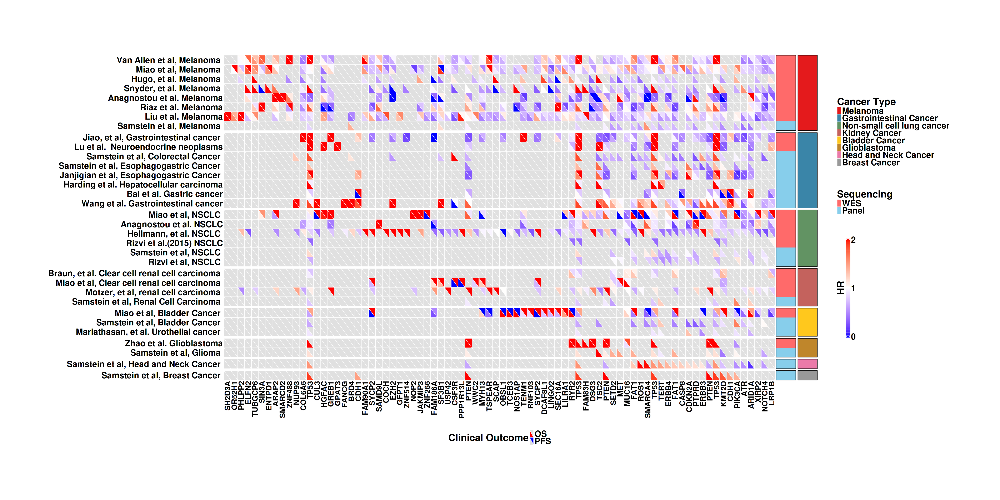

In [56]:
plot_complexheatmap3(C = C,OS_combind = OS_combind,PFS_combind = PFS_combind,nGene = 10)

In [57]:
# pdf("Artical_Figure2/Figure 1/SNVSCORE_single_gene5.new.pdf",width = 40,height = 30)
# plot_complexheatmap3(C = C,OS_combind = OS_combind,PFS_combind = PFS_combind,nGene = 10)
# dev.off()

All mutation types: OS, PFS.

Colors are not defined for: OS, PFS. They won't be shown in the
barplots.



png 
  2

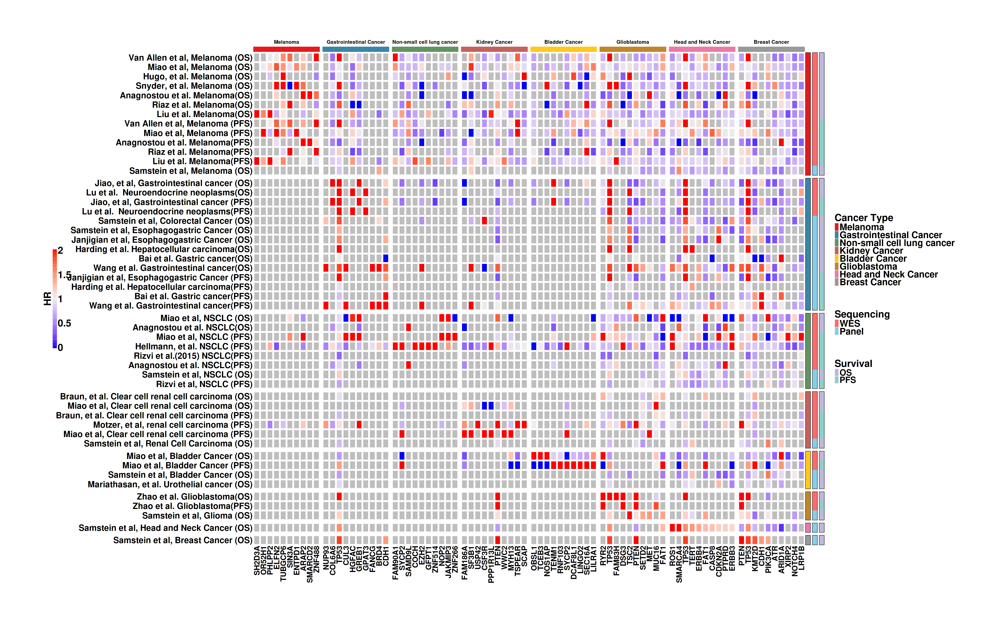

In [57]:
cancer_type =  c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                     "Glioblastoma","Head and Neck Cancer",
                     "Breast Cancer")

Cancer_specific_genes = vector()
for(i in cancer_type){
    tmp_A = RS_matrix_OS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
    tmp_B = RS_matrix_PFS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
    tmp_A[is.na(tmp_A)] = 0
    tmp_B[is.na(tmp_B)] = 0

    tmp_C = tmp_A+tmp_B
    names(tmp_C) = unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS)))

    tmp_C = sort(tmp_C,decreasing = T)
    
   Cancer_specific_genes = c(Cancer_specific_genes,names(tmp_C)[1:10]) #前十个
}

total_hm = vector()
total_meta = vector()

HR_matrix = reshape2::dcast(data = OS_combind[,c("dataset","HR(OS)","gene")],formula = dataset~gene,value.var = "HR(OS)")
rownames(HR_matrix) = HR_matrix$dataset
HR_matrix$dataset = NULL

HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
rownames(HR_matrix) = datasets_names[rownames(HR_matrix),]

meta = datasets_overview[ datasets_overview$Cohort_name %in% rownames(HR_matrix),]
rownames(meta) = paste(meta$Cohort_name,"(","OS",")",sep="")
meta = meta[,c("Cancer_type","Immune_checkpoint_blockade","Sequencing","Cancer_type2")]
meta$Survival = "OS"
total_meta = rbind(total_meta,meta)

rownames(HR_matrix) = paste(rownames(HR_matrix),"(","OS",")",sep="")
hm = as.matrix(HR_matrix)[ ,Cancer_specific_genes]
hm[ hm > 2 ] = 2
hm = hm[order(meta$Sequencing,decreasing = T),]
# hm = hm[ rowSums(is.na(hm)) != ncol(hm),]
total_hm = rbind(total_hm,hm)
##########
HR_matrix = reshape2::dcast(data = PFS_combind[,c("dataset","HR(PFS)","gene")],formula = dataset~gene,value.var = "HR(PFS)")
rownames(HR_matrix) = HR_matrix$dataset
HR_matrix$dataset = NULL

HR_matrix = HR_matrix[ rownames(datasets_names)[ rownames(datasets_names) %in% rownames(HR_matrix)],]
rownames(HR_matrix) = datasets_names[rownames(HR_matrix),]

meta = datasets_overview[ datasets_overview$Cohort_name %in% rownames(HR_matrix),]
rownames(meta) = paste(meta$Cohort_name,"(","PFS",")",sep="")
meta = meta[,c("Cancer_type","Immune_checkpoint_blockade","Sequencing","Cancer_type2")]
meta$Survival = "PFS"
total_meta = rbind(total_meta,meta)


rownames(HR_matrix) = paste(rownames(HR_matrix),"(","PFS",")",sep="")
hm = as.matrix(HR_matrix)[ ,Cancer_specific_genes]
hm[ hm > 2 ] = 2
hm = hm[order(meta$Sequencing,decreasing = T),]
# hm = hm[ rowSums(is.na(hm)) != ncol(hm),]
total_hm = rbind(total_hm,hm)

total_meta = total_meta[order(total_meta$Survival,decreasing = F),]
total_meta = total_meta[order(total_meta$Sequencing,decreasing = T),]
total_hm = total_hm[rownames(total_meta),]

a = colorRampPalette(RColorBrewer::brewer.pal(9,"Set1"))(8)
names(a) = cancer_type

row_ha1 = HeatmapAnnotation(
    show_legend = F,
    which = "row",
    CancerType=total_meta[rownames(total_hm),"Cancer_type2"],
    Sequencing=factor(total_meta[rownames(total_hm),"Sequencing"],levels = c("WES","Panel")),
    Survival=factor(total_meta[rownames(total_hm),"Survival"],levels = c("OS","PFS")),
    col = list(CancerType = a,Sequencing = c("WES"="indianred1","Panel"="skyblue"),Survival = c("OS"="#BEB8DC","PFS"="#8ECFC9")),
    show_annotation_name = F,
    border = TRUE,
    gap = unit(2, "mm")
    
)

col_ha1 = HeatmapAnnotation(
    show_legend = F,
    which = "column",
    CancerType=unlist(lapply(cancer_type,function(x){rep(x,10)})),
    col = list(CancerType = a),
    show_annotation_name = F,
    annotation_legend_param  = list(
                                        title = "Cancer_Type", legend_height = unit(8, "cm"),
                                        title_gp = gpar(fontsize = 18,fontface = "bold"),
                                        labels_gp = gpar(fontsize = 18,fontface = "bold"),
                                        title_position = "leftcenter-rot"
                                   )
    
)

ht = Heatmap(as.matrix(total_hm),width = ncol(total_hm)*unit(7, "mm"),height = nrow(total_hm)*unit(10, "mm"),
             right_annotation = row_ha1,
#              heatmap_height = unit(20,"cm"),
#              heatmap_width = unit(40,"cm"),
             row_names_side = "left",
             column_names_side = "bottom",
             heatmap_legend_param = list(title = "HR", legend_height = unit(10, "cm"),
                                        title_gp = gpar(fontsize = 28,fontface = "bold"),
                                        labels_gp = gpar(fontsize = 28,fontface = "bold"),
                                        title_position = "leftcenter-rot"
    #                                     at = c( 0,0.25,0.5,0.75, 1)
                                       ),
             top_annotation = col_ha1,
#              row_split = factor(meta[rownames(hm),"Cancer_type2"],levels = c("Melanoma","Gastrointestinal Cancer","Urothelial Cancer","Renal Cell Carcinoma",
#                                                                             "Non-small cell lung cancer","Glioblastoma","Hepatocellular carcinoma","Head and Neck Cancer","Breast Cancer","Pan-cancer")),
             row_split = factor(total_meta[rownames(total_hm),"Cancer_type2"],levels = c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                                                                            "Glioblastoma","Head and Neck Cancer","Breast Cancer")),
             row_title = NULL,
             row_gap = unit(3, "mm"),
             column_split = factor(unlist(lapply(cancer_type,function(x){rep(x,10)})),levels = c("Melanoma","Gastrointestinal Cancer","Non-small cell lung cancer","Kidney Cancer","Bladder Cancer",
                                                                            "Glioblastoma","Head and Neck Cancer","Breast Cancer")),
             column_title_gp =  gpar(fontface = "bold",cex = 1.2),
             column_gap = unit(3, "mm"),
             
             row_names_max_width = max_text_width(rownames(total_hm),gp = gpar(fontsize = 12)),
             column_names_max_height = max_text_width(colnames(total_hm),gp = gpar(cex = 22)),
             row_names_gp = gpar(fontface = "bold",cex = 2),
             column_names_gp = gpar(fontface = "bold",cex = 1.8),
#         col = colorRamp2(c( 0,0.25,0.5,0.75, 1), c("#FFFFE5","#C7E9B4", "#41B6C4","#225EA8","#081D58")),
        cluster_rows = F,
        cluster_columns = F,
        rect_gp = gpar(col = "white", lwd = 5)
       )

l1 =  Legend(
        labels = cancer_type,
        title = "Cancer Type",
        legend_gp = gpar(fill = a,fontsize = 20),
        title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
        labels_gp = gpar(col = "black", fontsize = 26,fontface="bold")
    )
l2 = Legend(
        labels = c("WES","Panel"),
        title = "Sequencing",
        legend_gp = gpar(fill = c("indianred1","skyblue"),fontsize = 20),
        title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
        labels_gp = gpar(col = "black", fontsize = 26,fontface="bold")
    )

l3 = Legend(
                labels = c("OS","PFS"),
                title = "Survival",
                legend_gp = gpar(fill = c("#BEB8DC","#8ECFC9"),fontsize = 20),
                title_gp = gpar(col = "black", fontsize = 28,fontface="bold"),
                labels_gp = gpar(col = "black", fontsize = 24,fontface="bold")
        )

options(repr.plot.height = 25, repr.plot.width = 40)

ht_opt$HEATMAP_LEGEND_PADDING = unit(8, "cm")
ht_opt$ANNOTATION_LEGEND_PADDING = unit(0, "cm")
draw(ht ,
     heatmap_legend_side ="left",
     annotation_legend_side = "right",
     annotation_legend_list = packLegend(l1,l2,l3,row_gap = unit(2.5,"cm"),gap = unit(2.5,"cm"))
    )

In [58]:
pdf("Artical_Figure2/Figure 1/SNVSCORE_single_gene5.pdf",width = 40,height = 30)
ht_opt$HEATMAP_LEGEND_PADDING = unit(8, "cm")
ht_opt$ANNOTATION_LEGEND_PADDING = unit(0, "cm")
draw(ht ,
     heatmap_legend_side ="left",
     annotation_legend_side = "right",
     annotation_legend_list = packLegend(l1,l2,l3,row_gap = unit(2.5,"cm"),gap = unit(2.5,"cm"))
    )
dev.off()

png 
  2

In [59]:
n = 20
for(i in c("Melanoma","Gastrointestinal Cancer","Bladder Cancer","Kidney Cancer","Non-small cell lung cancer")){
    tmp_A = RS_matrix_OS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
    tmp_B = RS_matrix_PFS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
    tmp_A[is.na(tmp_A)] = 0
    tmp_B[is.na(tmp_B)] = 0

    tmp_C = tmp_A+tmp_B
    names(tmp_C) = unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS)))

    tmp_C = sort(tmp_C,decreasing = T)
    
    
    one_cancer_RS = data.frame(GeneSymbol = names(tmp_C),SNV_score = tmp_C)
    one_cancer_RS = one_cancer_RS[ c(rownames(one_cancer_RS)[1:n],
                 rownames(one_cancer_RS)[(nrow(one_cancer_RS)-n+1):nrow(one_cancer_RS)]),]
    one_cancer_RS$GeneSymbol = factor(one_cancer_RS$GeneSymbol,levels = one_cancer_RS$GeneSymbol)
    one_cancer_RS$hjust = NA
    one_cancer_RS$hjust[1:n] = 1.1
    one_cancer_RS$hjust[(n+1):(n*2)] = -0.1
    options(repr.plot.height = 8, repr.plot.width = 8)
    p = ggplot(one_cancer_RS)+
            ggtitle(i)+
            geom_bar(aes(x = GeneSymbol,y = SNV_score,fill = as.character(hjust)),stat = "identity",show.legend = F)+
            scale_fill_manual(values = c("darkblue", "maroon"))+
            coord_flip()+
            theme_void()+
            ylab("ImmuneSNVscore")+
            scale_x_discrete(expand = c(0.05,0))+
            ylim(-max(abs(one_cancer_RS$SNV_score)),max(abs(one_cancer_RS$SNV_score)))+
            geom_text(aes(x = GeneSymbol,y = 0,label = GeneSymbol,hjust = hjust),fontface ="bold",size = 4.5)+
            theme(axis.line.x = element_line(colour = "black",linetype = "solid",size = 1.5),
                  axis.title.x = element_text(face = "bold",size = 18),
                  plot.title = element_text(hjust = 0.5,face = "bold",size = 22),
                  axis.ticks.length.x = unit(2,"mm"),
                  axis.text.x = element_text(face = "bold",size = 14,vjust = 0),
                  axis.ticks.x = element_line(colour = "black",linetype = "solid",size = 1 ))
    pdf(paste("Artical_Figure2/Figure 1/SNVSCORE_single_gene_",i,".pdf",sep = ""),width = 10,height = 10)
    print(p)
    dev.off()
}

In [60]:
one_RS_matrix = vector()
n = 100
for(i in c("Melanoma","Gastrointestinal Cancer","Bladder Cancer","Kidney Cancer","Non-small cell lung cancer")){
    tmp_A = RS_matrix_OS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
    tmp_B = RS_matrix_PFS[unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS))),i]
    tmp_A[is.na(tmp_A)] = 0
    tmp_B[is.na(tmp_B)] = 0

    tmp_C = tmp_A+tmp_B
    names(tmp_C) = unique(intersect(rownames(RS_matrix_OS),rownames(RS_matrix_PFS)))

    tmp_C = sort(tmp_C,decreasing = T)
    
    
    one_cancer_RS = data.frame(GeneSymbol = names(tmp_C),SNV_score = tmp_C)
    one_cancer_RS = one_cancer_RS[ c(rownames(one_cancer_RS)[1:n],
                 rownames(one_cancer_RS)[(nrow(one_cancer_RS)-n+1):nrow(one_cancer_RS)]),]
    one_cancer_RS$Cancer_type = i
    one_RS_matrix = rbind(one_RS_matrix,one_cancer_RS)
#     one_cancer_RS$GeneSymbol = factor(one_cancer_RS$GeneSymbol,levels = one_cancer_RS$GeneSymbol)
#     one_cancer_RS$hjust = NA
#     one_cancer_RS$hjust[1:n] = 1.1
#     one_cancer_RS$hjust[(n+1):(n*2)] = -0.1
#     options(repr.plot.height = 8, repr.plot.width = 8)
#     p = ggplot(one_cancer_RS)+
#             ggtitle(i)+
#             geom_bar(aes(x = GeneSymbol,y = SNV_score,fill = as.character(hjust)),stat = "identity",show.legend = F)+
#             scale_fill_manual(values = c("darkblue", "maroon"))+
#             coord_flip()+
#             theme_void()+
#             ylab("ImmuneSNVscore")+
#             scale_x_discrete(expand = c(0.05,0))+
#             ylim(-max(abs(one_cancer_RS$SNV_score)),max(abs(one_cancer_RS$SNV_score)))+
#             geom_text(aes(x = GeneSymbol,y = 0,label = GeneSymbol,hjust = hjust),fontface ="bold",size = 4.5)+
#             theme(axis.line.x = element_line(colour = "black",linetype = "solid",size = 1.5),
#                   axis.title.x = element_text(face = "bold",size = 18),
#                   plot.title = element_text(hjust = 0.5,face = "bold",size = 22),
#                   axis.ticks.length.x = unit(2,"mm"),
#                   axis.text.x = element_text(face = "bold",size = 14,vjust = 0),
#                   axis.ticks.x = element_line(colour = "black",linetype = "solid",size = 1 ))
#     pdf(paste("Artical_Figure2/Figure 1/SNVSCORE_single_gene_",i,".pdf",sep = ""),width = 10,height = 10)
#     print(p)
#     dev.off()
}

In [61]:
write.table(one_RS_matrix,file = "./Artical_Figure2/Figure 1/Single_Gene_Cancer_type_levels.txt",sep = "\t",row.names = F,col.names = T,quote = F)

### 单基因预后价值

In [62]:
ref_cohort_cal = function(dataset,gene,dataset_mu,Mut_type,Wild_type){
  
  if("All" %in% Mut_type){
    
    mut = unique(dataset_mu$ID[
      dataset_mu$Hugo_Symbol == gene
    ])
  }else{
    
    
    mut = unique(dataset_mu$ID[
      dataset_mu$Hugo_Symbol == gene & 
        dataset_mu$Variant_Classification %in% Mut_type
    ])
    
    
  }
  
  if(Wild_type == "Others"){
    wt = setdiff(unique(c(dataset_mu$ID,rownames(dataset))),mut)
  }else{
    wt = setdiff(unique(c(dataset_mu$ID,rownames(dataset))),unique(dataset_mu$ID[dataset_mu$Hugo_Symbol == gene]))
  }
  
  return(list("mut"=mut,"wt"=wt))
  
}

#### OS

In [66]:
n1 = 10
n2 = 10
# genes = c(names(C)[1:10],names(C)[(length(C)-9):length(C)])

In [67]:
genes = c(  "ATR",
            "NOTCH4",
            "TTN",
            "OBSCN",
            "XIRP2",
            "FLNC",
            "AKAP9",
            "FAT1",
            "NRXN1",
            "LRP1B",
            "ZFHX3",
            "AHNAK",
            "ARID1A",
            "FMN2",
            "COL11A1",
            "ANK1",
            "KMT2D",
            "KRAS",
            "KDM6A",
            "PPP1R13L",
            "RAPGEF2",
            "HIF1A",
            "SIN3A",
            "TP53")


In [68]:
total_cochrane_from_rmeta = vector()
total_tabletext = vector()
for( g in genes ){
    
    library(forestplot)
    library(meta)
    gene_name = g

    cohort = vector()
    wildtype = vector()
    mutation = vector()
    HR_mean = vector()
    HR_lower = vector()
    HR_upper = vector()
    HR_text = vector()
    logtest = vector()
    waldtest = vector()
    for(i in setdiff(names(datasets),c("dataset1","dataset3","dataset6"))){
      tmp_cohort = ref_cohort_cal(dataset = datasets[[i]],gene = gene_name,dataset_mu = datasets_mu[[i]],Mut_type = "All",Wild_type = "Wiltype")
      if(length(tmp_cohort$mut) >= 3 & length(tmp_cohort$wt) >= 3 & ("OS_TIME" %in% colnames(datasets[[i]]))){
        
#         wildtype = c(wildtype,length(tmp_cohort$wt))
#         mutation = c(mutation,length(tmp_cohort$mut))

        tmp_data = datasets[[i]][,c("OS_TIME","OS_STATUS")]

        tmp_data$groups = NA
        tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$mut] = "Mutation"
        tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$wt] = "Wildtype"
        tmp_data$groups = factor(tmp_data$groups,levels = c("Wildtype","Mutation"))

        tmp_data = tmp_data[rowSums(is.na(tmp_data)) == 0,]
        if(table(tmp_data$groups)["Mutation"] >= 3 & table(tmp_data$groups)["Wildtype"] >= 3 ){
            cohort = c(cohort,dataset_name[i])
            wildtype = c(wildtype,table(tmp_data$groups)["Wildtype"])
            mutation = c(mutation,table(tmp_data$groups)["Mutation"])
            
            # fit <- do.call(survfit, list(Surv(OS_TIME,OS_STATUS)~groups,data = tmp_data))
            data.survdiff <- do.call(survdiff, list(Surv(OS_TIME,OS_STATUS)~groups,data = tmp_data))
            p.val = round(1 - pchisq(data.survdiff$chisq, length(data.survdiff$n) - 1),4)
            coxres <- do.call(coxph, list(Surv(OS_TIME,OS_STATUS)~groups,data = tmp_data))
            HR_mean = c(HR_mean,round(summary(coxres)$conf.int[,1],3))
            HR_lower = c(HR_lower,round(summary(coxres)$conf.int[,3],3))
            HR_upper = c(HR_upper,round(summary(coxres)$conf.int[,4],3))
            HR_text = c(HR_text,paste(round(summary(coxres)$conf.int[,1],3),"(",round(summary(coxres)$conf.int[,3],3),"-",round(summary(coxres)$conf.int[,4],3),")"))
            logtest = c(logtest,round(summary(coxres)$logtest[3],3))
            waldtest = c(waldtest,round(summary(coxres)$waldtest[3],3))
        }




      }
    }

    ord = order(HR_mean)
    tabletext = cbind(
                      c(NA,"Cohort",cohort[ord],"Common","Random"),
                      c(NA,"Wild type",wildtype[ord],sum(wildtype),sum(wildtype)),
                      c(NA,"Mutation",mutation[ord],sum(mutation),sum(mutation)),
                      c(NA,"HR(95%CI)",HR_text[ord],NA,NA),
    #                   c(NA,"P value(Log rank)",logtest[ord],NA),
                      c(NA,"P value(wald text)",waldtest[ord],NA,NA))
    cochrane_from_rmeta = data.frame("mean" = c(NA,NA,HR_mean[ord],NA,NA),"lower" = c(NA,NA,HR_lower[ord],NA,NA),"upper" = c(NA,NA,HR_upper[ord],NA,NA))

    tmp = cochrane_from_rmeta[3:(nrow(cochrane_from_rmeta)-2),]
    rownames(tmp) = tabletext[3:(nrow(cochrane_from_rmeta)-2),1]
    tmp$se = (log2(tmp$upper) - log2(tmp$lower))/(2*1.96)
    m = metagen(TE = log2(tmp$mean),seTE = tmp$se,studlab = rownames(tmp),sm = "HR",method.tau = "DL")
    k = summary(m)

    chtext = paste(round(exp(x = 1)^(k$common$TE),3),"[",round(exp(x = 1)^(k$common$lower),3),",",round(exp(x = 1)^(k$common$upper),3),"]")
    tabletext[nrow(tabletext)-1,4:5] = c(chtext,round(k$common$p,3))
    cochrane_from_rmeta[nrow(tabletext)-1,1:3] = c(round(exp(x = 1)^(k$common$TE),3),round(exp(x = 1)^(k$common$lower),3),round(exp(x = 1)^(k$common$upper),3))
    rhtext = paste(round(exp(x = 1)^(k$random$TE),3),"[",round(exp(x = 1)^(k$random$lower),3),",",round(exp(x = 1)^(k$random$upper),3),"]")
    tabletext[nrow(tabletext),4:5] = c(rhtext,round(k$random$p,3))
    cochrane_from_rmeta[nrow(tabletext),1:3] = c(round(exp(x = 1)^(k$random$TE),3),round(exp(x = 1)^(k$random$lower),3),round(exp(x = 1)^(k$random$upper),3))
    
    if(k$pval.Q < 0.1){
        total_cochrane_from_rmeta = rbind(total_cochrane_from_rmeta,cochrane_from_rmeta[nrow(tabletext),])
        total_tabletext = rbind(total_tabletext,c(gene_name,tabletext[nrow(tabletext),]))
    }else{
        total_cochrane_from_rmeta = rbind(total_cochrane_from_rmeta,cochrane_from_rmeta[nrow(tabletext)-1,])
        total_tabletext = rbind(total_tabletext,c(gene_name,tabletext[nrow(tabletext)-1,]))
    }    
}

total_tabletext = total_tabletext[,c(1,5,6)]
total_tabletext[,3][as.numeric(total_tabletext[,3]) < 0.001] = "< 0.001"
total_tabletext = rbind(c("Gene symbol","HR(95%CI)","P-meta"),total_tabletext)
total_cochrane_from_rmeta = rbind(c(NA,NA,NA),total_cochrane_from_rmeta)

Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, c

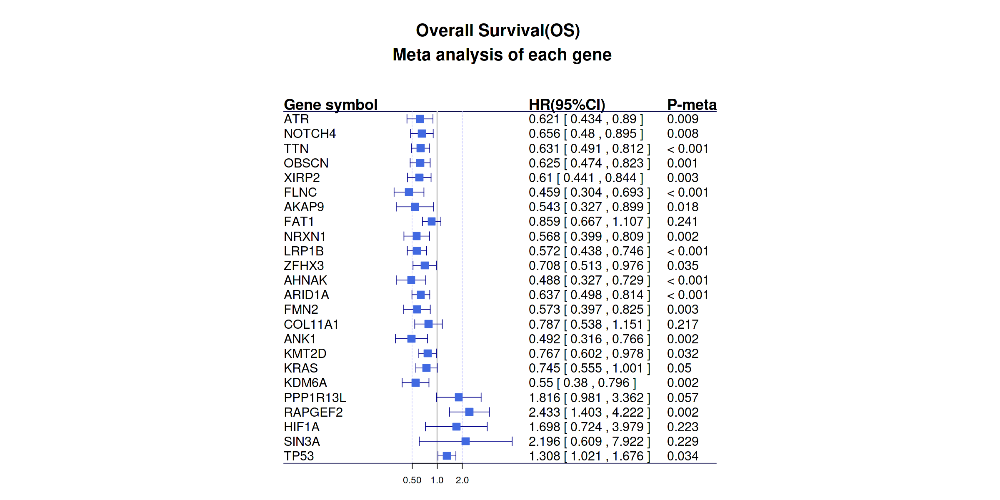

In [69]:
maxup = max(total_cochrane_from_rmeta$upper[!is.infinite(total_cochrane_from_rmeta$upper)],na.rm = T)
minlow = min(total_cochrane_from_rmeta$lower[total_cochrane_from_rmeta$lower != 0],na.rm = T)

    
options(repr.plot.height = 10, repr.plot.width = 20)

tmp_list = list()
tmp_list[["2"]] = gpar(col = "#000044")
tmp_list[[as.character(nrow(total_cochrane_from_rmeta) + 1)]] = gpar(col = "#000044")

p = total_cochrane_from_rmeta %>% 
       forestplot(labeltext = total_tabletext, clip = c(minlow-minlow/10,maxup+maxup/10),xticks = c(0.5,1,2),
                      lty.ci = 1,
                      ci.vertices.height = 0.3,
                     align="l",
                     graphwidth = unit(6,"cm"),
                     lwd.zero = gpar(lwd=2,lty=2),
                     grid = structure(c(0.5, 2), 
                            gp = gpar(lwd = 1,lty = 2, col = "#CCCCFF")),
                     boxsize = 0.5,
                     graph.pos = 2,
#                      zero = 1,
                     title = paste("Overall Survival(OS)","\n","Meta analysis of each gene"),
                     txt_gp = fpTxtGp(title = gpar(cex = 2),ticks=gpar(cex=1.1),summary=gpar(cex = 1.8),label = gpar(cex = 1.5)),
                     is.summary = c(rep(TRUE, 1), rep(FALSE, nrow(total_cochrane_from_rmeta)-1)),
                     xlog = TRUE, 
                     hrzl_lines = tmp_list,
                     vertices = TRUE,
                     col = fpColors(box = "royalblue",
                                    line = "darkblue",
                                    summary = "royalblue")
                     )
p

In [70]:
pdf(paste("Artical_Figure2/Figure 1/SNVSCORE_single_gene_meta_OS.pdf",sep = ""),width = 10,height = 10)
print(p)
dev.off()

png 
  2

In [71]:
genes = c(names(C)[1:100],names(C)[(length(C)-49):length(C)])

total_cochrane_from_rmeta = vector()
total_tabletext = vector()
for( g in genes ){
    
    library(forestplot)
    library(meta)
    gene_name = g

    cohort = vector()
    wildtype = vector()
    mutation = vector()
    HR_mean = vector()
    HR_lower = vector()
    HR_upper = vector()
    HR_text = vector()
    logtest = vector()
    waldtest = vector()
    for(i in setdiff(names(datasets),c("dataset1","dataset3","dataset6"))){
      tmp_cohort = ref_cohort_cal(dataset = datasets[[i]],gene = gene_name,dataset_mu = datasets_mu[[i]],Mut_type = "All",Wild_type = "Wiltype")
      if(length(tmp_cohort$mut) >= 3 & length(tmp_cohort$wt) >= 3 & ("OS_TIME" %in% colnames(datasets[[i]]))){
          
#         cohort = c(cohort,dataset_name[i])
#         wildtype = c(wildtype,length(tmp_cohort$wt))
#         mutation = c(mutation,length(tmp_cohort$mut))

        tmp_data = datasets[[i]][,c("OS_TIME","OS_STATUS")]

        tmp_data$groups = NA
        tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$mut] = "Mutation"
        tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$wt] = "Wildtype"
        tmp_data$groups = factor(tmp_data$groups,levels = c("Wildtype","Mutation"))

        tmp_data = tmp_data[rowSums(is.na(tmp_data)) == 0,]
        if(table(tmp_data$groups)["Mutation"] >= 3 & table(tmp_data$groups)["Wildtype"] >= 3 ){
            cohort = c(cohort,dataset_name[i])
            wildtype = c(wildtype,table(tmp_data$groups)["Wildtype"])
            mutation = c(mutation,table(tmp_data$groups)["Mutation"])
            
            # fit <- do.call(survfit, list(Surv(OS_TIME,OS_STATUS)~groups,data = tmp_data))
            data.survdiff <- do.call(survdiff, list(Surv(OS_TIME,OS_STATUS)~groups,data = tmp_data))
            p.val = round(1 - pchisq(data.survdiff$chisq, length(data.survdiff$n) - 1),4)
            coxres <- do.call(coxph, list(Surv(OS_TIME,OS_STATUS)~groups,data = tmp_data))
            HR_mean = c(HR_mean,round(summary(coxres)$conf.int[,1],3))
            HR_lower = c(HR_lower,round(summary(coxres)$conf.int[,3],3))
            HR_upper = c(HR_upper,round(summary(coxres)$conf.int[,4],3))
            HR_text = c(HR_text,paste(round(summary(coxres)$conf.int[,1],3),"(",round(summary(coxres)$conf.int[,3],3),"-",round(summary(coxres)$conf.int[,4],3),")"))
            logtest = c(logtest,round(summary(coxres)$logtest[3],3))
            waldtest = c(waldtest,round(summary(coxres)$waldtest[3],3))
            
        }




      }
    }

    ord = order(HR_mean)
    tabletext = cbind(
                      c(NA,"Cohort",cohort[ord],"Common","Random"),
                      c(NA,"Wild type",wildtype[ord],sum(wildtype),sum(wildtype)),
                      c(NA,"Mutation",mutation[ord],sum(mutation),sum(mutation)),
                      c(NA,"HR(95%CI)",HR_text[ord],NA,NA),
    #                   c(NA,"P value(Log rank)",logtest[ord],NA),
                      c(NA,"P value(wald text)",waldtest[ord],NA,NA))
    cochrane_from_rmeta = data.frame("mean" = c(NA,NA,HR_mean[ord],NA,NA),"lower" = c(NA,NA,HR_lower[ord],NA,NA),"upper" = c(NA,NA,HR_upper[ord],NA,NA))

    tmp = cochrane_from_rmeta[3:(nrow(cochrane_from_rmeta)-2),]
    rownames(tmp) = tabletext[3:(nrow(cochrane_from_rmeta)-2),1]
    tmp$se = (log2(tmp$upper) - log2(tmp$lower))/(2*1.96)
    m = metagen(TE = log2(tmp$mean),seTE = tmp$se,studlab = rownames(tmp),sm = "HR",method.tau = "DL")
    k = summary(m)

    if(is.na(k$pval.Q)){
        total_tabletext = rbind(total_tabletext,c(gene_name,rep("--",5),nrow(tmp)))
    }else{
            chtext = paste(round(exp(x = 1)^(k$common$TE),3),"[",round(exp(x = 1)^(k$common$lower),3),",",round(exp(x = 1)^(k$common$upper),3),"]")
            tabletext[nrow(tabletext)-1,4:5] = c(chtext,round(k$common$p,3))
            cochrane_from_rmeta[nrow(tabletext)-1,1:3] = c(round(exp(x = 1)^(k$common$TE),3),round(exp(x = 1)^(k$common$lower),3),round(exp(x = 1)^(k$common$upper),3))
            rhtext = paste(round(exp(x = 1)^(k$random$TE),3),"[",round(exp(x = 1)^(k$random$lower),3),",",round(exp(x = 1)^(k$random$upper),3),"]")
            tabletext[nrow(tabletext),4:5] = c(rhtext,round(k$random$p,3))
            cochrane_from_rmeta[nrow(tabletext),1:3] = c(round(exp(x = 1)^(k$random$TE),3),round(exp(x = 1)^(k$random$lower),3),round(exp(x = 1)^(k$random$upper),3))

            if(k$pval.Q < 0.1){
                total_cochrane_from_rmeta = rbind(total_cochrane_from_rmeta,cochrane_from_rmeta[nrow(tabletext),])
                total_tabletext = rbind(total_tabletext,c(gene_name,tabletext[nrow(tabletext),],nrow(tmp)))
            }else{
                total_cochrane_from_rmeta = rbind(total_cochrane_from_rmeta,cochrane_from_rmeta[nrow(tabletext)-1,])
                total_tabletext = rbind(total_tabletext,c(gene_name,tabletext[nrow(tabletext)-1,],nrow(tmp)))
            }  
    }
  
}

# total_tabletext = total_tabletext[,c(1,5,6)]
# total_tabletext[,3][as.numeric(total_tabletext[,3]) < 0.001] = "< 0.001"
# total_tabletext = rbind(c("Gene symbol","HR(95%CI)","P-meta"),total_tabletext)
# total_cochrane_from_rmeta = rbind(c(NA,NA,NA),total_cochrane_from_rmeta)

Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, c

Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, c

Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, c

In [72]:
total_tabletext = cbind(total_tabletext,C[genes])
colnames(total_tabletext) = c("Gene Symbol","Meta model(OS)","Mutation","Wildtype","HR[95%CI,OS]","P-meta(OS)","Num of datasets(OS)","SNVscore")
OS_total_tabletext = total_tabletext

#### PFS

In [73]:
n1 = 10
n2 = 10
# genes = c(names(C)[1:10],names(C)[(length(C)-9):length(C)])

genes = c(  "ATR",
            "NOTCH4",
            "TTN",
            "OBSCN",
            "XIRP2",
            "FLNC",
            "AKAP9",
            "FAT1",
            "NRXN1",
            "LRP1B",
            "ZFHX3",
            "AHNAK",
            "ARID1A",
            "FMN2",
            "COL11A1",
            "ANK1",
            "KMT2D",
            "KRAS",
            "KDM6A",
            "PPP1R13L",
            "RAPGEF2",
            "HIF1A",
            "SIN3A",
            "TP53")

In [74]:
total_cochrane_from_rmeta = vector()
total_tabletext = vector()
for( g in genes ){
    
    gene_name = g

    cohort = vector()
    wildtype = vector()
    mutation = vector()
    HR_mean = vector()
    HR_lower = vector()
    HR_upper = vector()
    HR_text = vector()
    logtest = vector()
    waldtest = vector()
    for(i in setdiff(names(datasets),c("dataset1","dataset3","dataset6"))){
      tmp_cohort = ref_cohort_cal(dataset = datasets[[i]],gene = gene_name,dataset_mu = datasets_mu[[i]],Mut_type = "All",Wild_type = "Wiltype")
      if(length(tmp_cohort$mut) >=3 & length(tmp_cohort$wt) >= 3 & ("PFS_TIME" %in% colnames(datasets[[i]]))){
#         cohort = c(cohort,dataset_name[i])
#         wildtype = c(wildtype,length(tmp_cohort$wt))
#         mutation = c(mutation,length(tmp_cohort$mut))

        tmp_data = datasets[[i]][,c("PFS_TIME","PFS_STATUS")]

        tmp_data$groups = NA
        tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$mut] = "Mutation"
        tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$wt] = "Wildtype"
        tmp_data$groups = factor(tmp_data$groups,levels = c("Wildtype","Mutation"))

          
        tmp_data = tmp_data[rowSums(is.na(tmp_data)) == 0,]
        if(table(tmp_data$groups)["Mutation"] >= 3 & table(tmp_data$groups)["Wildtype"] >= 3 ){
            cohort = c(cohort,dataset_name[i])
            wildtype = c(wildtype,table(tmp_data$groups)["Wildtype"])
            mutation = c(mutation,table(tmp_data$groups)["Mutation"])
            
            # fit <- do.call(survfit, list(Surv(OS_TIME,OS_STATUS)~groups,data = tmp_data))
            data.survdiff <- do.call(survdiff, list(Surv(PFS_TIME,PFS_STATUS)~groups,data = tmp_data))
            p.val = round(1 - pchisq(data.survdiff$chisq, length(data.survdiff$n) - 1),4)
            coxres <- do.call(coxph, list(Surv(PFS_TIME,PFS_STATUS)~groups,data = tmp_data))
            HR_mean = c(HR_mean,round(summary(coxres)$conf.int[,1],3))
            HR_lower = c(HR_lower,round(summary(coxres)$conf.int[,3],3))
            HR_upper = c(HR_upper,round(summary(coxres)$conf.int[,4],3))
            HR_text = c(HR_text,paste(round(summary(coxres)$conf.int[,1],3),"(",round(summary(coxres)$conf.int[,3],3),"-",round(summary(coxres)$conf.int[,4],3),")"))
            logtest = c(logtest,round(summary(coxres)$logtest[3],3))
            waldtest = c(waldtest,round(summary(coxres)$waldtest[3],3))  
            
            
        }




      }
    }

    ord = order(HR_mean)
    tabletext = cbind(
                      c(NA,"Cohort",cohort[ord],"Common","Random"),
                      c(NA,"Wild type",wildtype[ord],sum(wildtype),sum(wildtype)),
                      c(NA,"Mutation",mutation[ord],sum(mutation),sum(mutation)),
                      c(NA,"HR(95%CI)",HR_text[ord],NA,NA),
    #                   c(NA,"P value(Log rank)",logtest[ord],NA),
                      c(NA,"P value(wald text)",waldtest[ord],NA,NA))
    cochrane_from_rmeta = data.frame("mean" = c(NA,NA,HR_mean[ord],NA,NA),"lower" = c(NA,NA,HR_lower[ord],NA,NA),"upper" = c(NA,NA,HR_upper[ord],NA,NA))

    tmp = cochrane_from_rmeta[3:(nrow(cochrane_from_rmeta)-2),]
    rownames(tmp) = tabletext[3:(nrow(cochrane_from_rmeta)-2),1]
    tmp$se = (log2(tmp$upper) - log2(tmp$lower))/(2*1.96)
    m = metagen(TE = log2(tmp$mean),seTE = tmp$se,studlab = rownames(tmp),sm = "HR",method.tau = "DL")
    k = summary(m)

    chtext = paste(round(exp(x = 1)^(k$common$TE),3),"[",round(exp(x = 1)^(k$common$lower),3),",",round(exp(x = 1)^(k$common$upper),3),"]")
    tabletext[nrow(tabletext)-1,4:5] = c(chtext,round(k$common$p,3))
    cochrane_from_rmeta[nrow(tabletext)-1,1:3] = c(round(exp(x = 1)^(k$common$TE),3),round(exp(x = 1)^(k$common$lower),3),round(exp(x = 1)^(k$common$upper),3))
    rhtext = paste(round(exp(x = 1)^(k$random$TE),3),"[",round(exp(x = 1)^(k$random$lower),3),",",round(exp(x = 1)^(k$random$upper),3),"]")
    tabletext[nrow(tabletext),4:5] = c(rhtext,round(k$random$p,3))
    cochrane_from_rmeta[nrow(tabletext),1:3] = c(round(exp(x = 1)^(k$random$TE),3),round(exp(x = 1)^(k$random$lower),3),round(exp(x = 1)^(k$random$upper),3))

    if(k$pval.Q < 0.1){
        total_cochrane_from_rmeta = rbind(total_cochrane_from_rmeta,cochrane_from_rmeta[nrow(tabletext),])
        total_tabletext = rbind(total_tabletext,c(gene_name,tabletext[nrow(tabletext),]))
    }else{
        total_cochrane_from_rmeta = rbind(total_cochrane_from_rmeta,cochrane_from_rmeta[nrow(tabletext)-1,])
        total_tabletext = rbind(total_tabletext,c(gene_name,tabletext[nrow(tabletext)-1,]))
    }    
}

total_tabletext = total_tabletext[,c(1,5,6)]
total_tabletext[,3][as.numeric(total_tabletext[,3]) < 0.001] = "< 0.001"
total_tabletext = rbind(c("Gene symbol","HR(95%CI)","P-meta"),total_tabletext)
total_cochrane_from_rmeta = rbind(c(NA,NA,NA),total_cochrane_from_rmeta)

Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, c

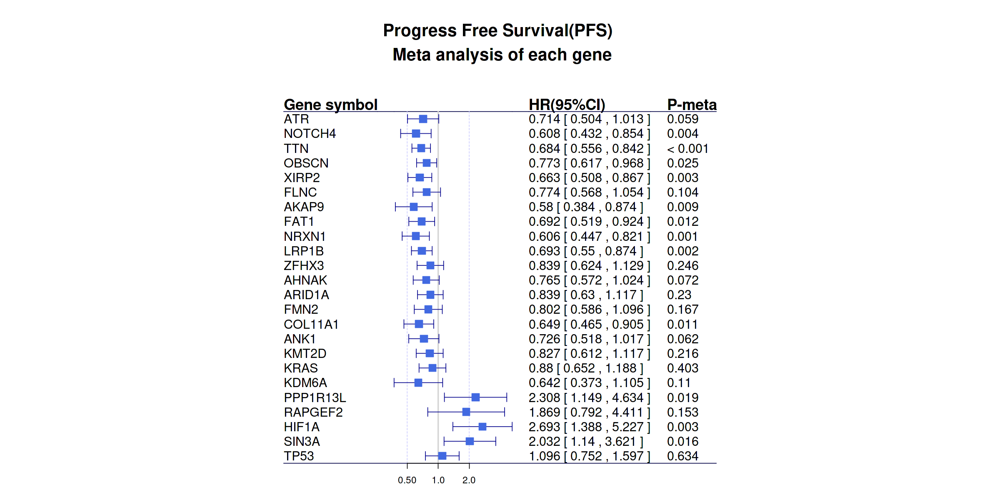

In [75]:
maxup = max(total_cochrane_from_rmeta$upper[!is.infinite(total_cochrane_from_rmeta$upper)],na.rm = T)
minlow = min(total_cochrane_from_rmeta$lower[total_cochrane_from_rmeta$lower != 0],na.rm = T)

    
options(repr.plot.height = 10, repr.plot.width = 20)

tmp_list = list()
tmp_list[["2"]] = gpar(col = "#000044")
tmp_list[[as.character(nrow(total_cochrane_from_rmeta) + 1)]] = gpar(col = "#000044")

p = total_cochrane_from_rmeta %>% 
       forestplot(labeltext = total_tabletext, clip = c(minlow-minlow/10,maxup+maxup/10),xticks = c(0.5,1,2),
                      lty.ci = 1,
                      ci.vertices.height = 0.3,
                     align="l",
                     graphwidth = unit(6,"cm"),
                     lwd.zero = gpar(lwd=2,lty=2),
                     grid = structure(c(0.5, 2), 
                            gp = gpar(lwd = 1,lty = 2, col = "#CCCCFF")),
                     boxsize = 0.5,
                     graph.pos = 2,
#                      zero = 1,
                     title = paste("Progress Free Survival(PFS)","\n","Meta analysis of each gene"),
                     txt_gp = fpTxtGp(title = gpar(cex = 2),ticks=gpar(cex=1.1),summary=gpar(cex = 1.8),label = gpar(cex = 1.5)),
                     is.summary = c(rep(TRUE, 1), rep(FALSE, nrow(total_cochrane_from_rmeta)-1)),
                     xlog = TRUE, 
                     hrzl_lines = tmp_list,
                     vertices = TRUE,
                     col = fpColors(box = "royalblue",
                                    line = "darkblue",
                                    summary = "royalblue")
                     )
p

In [76]:
pdf(paste("Artical_Figure2/Figure 1/SNVSCORE_single_gene_meta_PFS.pdf",sep = ""),width = 10,height = 10)
print(p)
dev.off()

png 
  2

In [77]:
genes = c(names(C)[1:100],names(C)[(length(C)-49):length(C)])
total_cochrane_from_rmeta = vector()
total_tabletext = vector()
for( g in genes ){
    
    gene_name = g

    cohort = vector()
    wildtype = vector()
    mutation = vector()
    HR_mean = vector()
    HR_lower = vector()
    HR_upper = vector()
    HR_text = vector()
    logtest = vector()
    waldtest = vector()
    for(i in setdiff(names(datasets),c("dataset1","dataset3","dataset6"))){
      tmp_cohort = ref_cohort_cal(dataset = datasets[[i]],gene = gene_name,dataset_mu = datasets_mu[[i]],Mut_type = "All",Wild_type = "Wiltype")
      if(length(tmp_cohort$mut) >=3 & length(tmp_cohort$wt) >= 3 & ("PFS_TIME" %in% colnames(datasets[[i]]))){
#         cohort = c(cohort,dataset_name[i])
#         wildtype = c(wildtype,length(tmp_cohort$wt))
#         mutation = c(mutation,length(tmp_cohort$mut))

        tmp_data = datasets[[i]][,c("PFS_TIME","PFS_STATUS")]

        tmp_data$groups = NA
        tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$mut] = "Mutation"
        tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$wt] = "Wildtype"
        tmp_data$groups = factor(tmp_data$groups,levels = c("Wildtype","Mutation"))

        tmp_data = tmp_data[rowSums(is.na(tmp_data)) == 0,]
        if(table(tmp_data$groups)["Mutation"] >= 3 & table(tmp_data$groups)["Wildtype"] >= 3 ){
            cohort = c(cohort,dataset_name[i])
            wildtype = c(wildtype,table(tmp_data$groups)["Wildtype"])
            mutation = c(mutation,table(tmp_data$groups)["Mutation"])
            
            # fit <- do.call(survfit, list(Surv(OS_TIME,OS_STATUS)~groups,data = tmp_data))
            data.survdiff <- do.call(survdiff, list(Surv(PFS_TIME,PFS_STATUS)~groups,data = tmp_data))
            p.val = round(1 - pchisq(data.survdiff$chisq, length(data.survdiff$n) - 1),4)
            coxres <- do.call(coxph, list(Surv(PFS_TIME,PFS_STATUS)~groups,data = tmp_data))
            HR_mean = c(HR_mean,round(summary(coxres)$conf.int[,1],3))
            HR_lower = c(HR_lower,round(summary(coxres)$conf.int[,3],3))
            HR_upper = c(HR_upper,round(summary(coxres)$conf.int[,4],3))
            HR_text = c(HR_text,paste(round(summary(coxres)$conf.int[,1],3),"(",round(summary(coxres)$conf.int[,3],3),"-",round(summary(coxres)$conf.int[,4],3),")"))
            logtest = c(logtest,round(summary(coxres)$logtest[3],3))
            waldtest = c(waldtest,round(summary(coxres)$waldtest[3],3))  
            
            
        }



      }
    }

    ord = order(HR_mean)
    tabletext = cbind(
                      c(NA,"Cohort",cohort[ord],"Common","Random"),
                      c(NA,"Wild type",wildtype[ord],sum(wildtype),sum(wildtype)),
                      c(NA,"Mutation",mutation[ord],sum(mutation),sum(mutation)),
                      c(NA,"HR(95%CI)",HR_text[ord],NA,NA),
    #                   c(NA,"P value(Log rank)",logtest[ord],NA),
                      c(NA,"P value(wald text)",waldtest[ord],NA,NA))
    cochrane_from_rmeta = data.frame("mean" = c(NA,NA,HR_mean[ord],NA,NA),"lower" = c(NA,NA,HR_lower[ord],NA,NA),"upper" = c(NA,NA,HR_upper[ord],NA,NA))

    tmp = cochrane_from_rmeta[3:(nrow(cochrane_from_rmeta)-2),]
    rownames(tmp) = tabletext[3:(nrow(cochrane_from_rmeta)-2),1]
    tmp$se = (log2(tmp$upper) - log2(tmp$lower))/(2*1.96)
    m = metagen(TE = log2(tmp$mean),seTE = tmp$se,studlab = rownames(tmp),sm = "HR",method.tau = "DL")
    k = summary(m)

    if(is.na(k$pval.Q)){
        total_tabletext = rbind(total_tabletext,c(gene_name,rep("--",5),nrow(tmp)))
    }else{
            chtext = paste(round(exp(x = 1)^(k$common$TE),3),"[",round(exp(x = 1)^(k$common$lower),3),",",round(exp(x = 1)^(k$common$upper),3),"]")
            tabletext[nrow(tabletext)-1,4:5] = c(chtext,round(k$common$p,3))
            cochrane_from_rmeta[nrow(tabletext)-1,1:3] = c(round(exp(x = 1)^(k$common$TE),3),round(exp(x = 1)^(k$common$lower),3),round(exp(x = 1)^(k$common$upper),3))
            rhtext = paste(round(exp(x = 1)^(k$random$TE),3),"[",round(exp(x = 1)^(k$random$lower),3),",",round(exp(x = 1)^(k$random$upper),3),"]")
            tabletext[nrow(tabletext),4:5] = c(rhtext,round(k$random$p,3))
            cochrane_from_rmeta[nrow(tabletext),1:3] = c(round(exp(x = 1)^(k$random$TE),3),round(exp(x = 1)^(k$random$lower),3),round(exp(x = 1)^(k$random$upper),3))

            if(k$pval.Q < 0.1){
                total_cochrane_from_rmeta = rbind(total_cochrane_from_rmeta,cochrane_from_rmeta[nrow(tabletext),])
                total_tabletext = rbind(total_tabletext,c(gene_name,tabletext[nrow(tabletext),],nrow(tmp)))
            }else{
                total_cochrane_from_rmeta = rbind(total_cochrane_from_rmeta,cochrane_from_rmeta[nrow(tabletext)-1,])
                total_tabletext = rbind(total_tabletext,c(gene_name,tabletext[nrow(tabletext)-1,],nrow(tmp)))
            }  
    }   
}

Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, c

Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, c

In [78]:
total_tabletext = cbind(total_tabletext,C[genes])
colnames(total_tabletext) = c("Gene Symbol","Meta model(PFS)","Mutation","Wildtype","HR[95%CI,PFS]","P-meta(PFS)","Num of datasets(PFS)","SNVscore")
PFS_total_tabletext = total_tabletext

In [79]:
cbind(OS_total_tabletext[,c(1,2,5,6,7)],PFS_total_tabletext[,c(2,5,6,7,8)])

,Gene Symbol,Meta model(OS),"HR[95%CI,OS]",P-meta(OS),Num of datasets(OS),Meta model(PFS),"HR[95%CI,PFS]",P-meta(PFS),Num of datasets(PFS),SNVscore
ATR,ATR,Common,"0.621 [ 0.434 , 0.89 ]",0.009,19,Common,"0.714 [ 0.504 , 1.013 ]",0.059,13,-2.27245403307125
TENM4,TENM4,Common,"0.685 [ 0.446 , 1.052 ]",0.084,10,Common,"0.646 [ 0.458 , 0.91 ]",0.013,10,-2.26147317306484
NOTCH4,NOTCH4,Common,"0.656 [ 0.48 , 0.895 ]",0.008,18,Common,"0.608 [ 0.432 , 0.854 ]",0.004,12,-2.24236223147134
TTN,TTN,Common,"0.631 [ 0.491 , 0.812 ]",0,13,Common,"0.684 [ 0.556 , 0.842 ]",0,14,-2.17939178718259
OBSCN,OBSCN,Common,"0.625 [ 0.474 , 0.823 ]",0.001,13,Common,"0.773 [ 0.617 , 0.968 ]",0.025,14,-2.04172919410875
XIRP2,XIRP2,Common,"0.61 [ 0.441 , 0.844 ]",0.003,12,Common,"0.663 [ 0.508 , 0.867 ]",0.003,12,-1.9153822881437
FLNC,FLNC,Common,"0.459 [ 0.304 , 0.693 ]",0,11,Common,"0.774 [ 0.568 , 1.054 ]",0.104,12,-1.88549880406472
AKAP9,AKAP9,Common,"0.543 [ 0.327 , 0.899 ]",0.018,11,Common,"0.58 [ 0.384 , 0.874 ]",0.009,12,-1.85966045683447
FAT1,FAT1,Common,"0.859 [ 0.667 , 1.107 ]",0.241,22,Common,"0.692 [ 0.519 , 0.924 ]",0.012,15,-1.81899507101903
NRXN1,NRXN1,Common,"0.568 [ 0.399 , 0.809 ]",0.002,12,Common,"0.606 [ 0.447 , 0.821 ]",0.001,12,-1.66859512758796


In [80]:
write.table(cbind(OS_total_tabletext[,c(1,2,5,6,7)],PFS_total_tabletext[,c(2,5,6,7,8)]),file = "./Artical_Figure2/Figure 1/Single_Gene_PanCancer.txt",sep = "\t",quote = F,row.names = F,col.names = T)

#### RESPONSE + RECIST

In [81]:
n1 = 10
n2 = 10
# genes = c(names(C)[1:10],names(C)[(length(C)-9):length(C)])

genes = c(  "ATR",
            "NOTCH4",
            "TTN",
            "OBSCN",
            "XIRP2",
            "FLNC",
            "AKAP9",
            "FAT1",
            "NRXN1",
            "LRP1B",
            "ZFHX3",
            "AHNAK",
            "ARID1A",
            "FMN2",
            "COL11A1",
            "ANK1",
            "KMT2D",
            "KRAS",
            "KDM6A",
            "PPP1R13L",
            "RAPGEF2",
            "HIF1A",
            "SIN3A",
            "TP53")

In [82]:
library(epitools)
total_cochrane_from_rmeta = vector()
total_tabletext = vector()
for( g in genes ){
    gene_name = g
    cohort = vector()
    NCB = vector()
    DCB = vector()
    OR_mean = vector()
    OR_lower = vector()
    OR_upper = vector()
    OR_text = vector()
    midp.exact = vector()
    chi.square = vector()
    fisher.exact = vector()
    for(i in setdiff(names(datasets),c("dataset1","dataset3","dataset6"))){
      tmp_cohort = ref_cohort_cal(dataset = datasets[[i]],gene = gene_name,dataset_mu = datasets_mu[[i]],Mut_type = "All",Wild_type = "Wiltype")
      if(length(tmp_cohort$mut) >= 3 & length(tmp_cohort$wt) >= 3 & ("RESPONSE" %in% colnames(datasets[[i]]))){

#         cohort = c(cohort,dataset_name[i])


        tmp_data = datasets[[i]][c("RESPONSE")]

        tmp_data$groups = NA
        tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$mut] = "Mutation"
        tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$wt] = "Wildtype"
        tmp_data$groups = factor(tmp_data$groups,levels = c("Wildtype","Mutation"))
        
        tmp_data = tmp_data[rowSums(is.na(tmp_data)) == 0,]
        if(table(tmp_data$groups)["Mutation"] >= 3 & table(tmp_data$groups)["Wildtype"] >= 3 ){
            cohort = c(cohort,dataset_name[i])

            wildtype = c(wildtype,table(tmp_data$groups)["Wildtype"])
            mutation = c(mutation,table(tmp_data$groups)["Mutation"])
            
            contingency = table(tmp_data$groups,tmp_data$RESPONSE)
            tmp_chi = chisq.test(contingency,correct = F)

            if(sum(tmp_chi$expected < 5) > 0){

                    rr_RESPONSE = oddsratio(contingency,correction = T,rev = "both",method = c( "fisher"))
            }else{

                    rr_RESPONSE = oddsratio(contingency,correction = F,rev = "both",method = c( "fisher"))
            }


              NCB = c(NCB,paste(rr_RESPONSE$data["Mutation","nonresponse"],rr_RESPONSE$data["Total","nonresponse"],sep = "/"))
              DCB = c(DCB,paste(rr_RESPONSE$data["Mutation","response"],rr_RESPONSE$data["Total","response"],sep = "/"))

              OR_mean = c(OR_mean,rr_RESPONSE$measure[2,1])
              OR_lower = c(OR_lower,rr_RESPONSE$measure[2,2])
              OR_upper = c(OR_upper,rr_RESPONSE$measure[2,3])
              OR_text = c(OR_text,paste(round(rr_RESPONSE$measure[2,1],digits = 3),"(",round(rr_RESPONSE$measure[2,2],digits = 3),"-",round(rr_RESPONSE$measure[2,3],digits = 3),")"))
              midp.exact = c(midp.exact,round(rr_RESPONSE$p.value[2,1],digits = 3))
              chi.square = c(chi.square,round(rr_RESPONSE$p.value[2,3],digits = 3))
              fisher.exact = c(fisher.exact,round(rr_RESPONSE$p.value[2,2],digits = 3))
            
        
        }
        



      }else if(length(tmp_cohort$mut) >= 3 & length(tmp_cohort$wt) >= 3 & ("RECIST" %in% colnames(datasets[[i]]))){
#           cohort = c(cohort,dataset_name[i])


          tmp_data = datasets[[i]][c("RECIST")]

          tmp_data$groups = NA
          tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$mut] = "Mutation"
          tmp_data$groups[rownames(tmp_data) %in% tmp_cohort$wt] = "Wildtype"
          tmp_data$groups = factor(tmp_data$groups,levels = c("Wildtype","Mutation"))

          
          tmp_data = tmp_data[rowSums(is.na(tmp_data)) == 0,]
          if(table(tmp_data$groups)["Mutation"] >= 3 & table(tmp_data$groups)["Wildtype"] >= 3 ){
              cohort = c(cohort,dataset_name[i])

              wildtype = c(wildtype,table(tmp_data$groups)["Wildtype"])
              mutation = c(mutation,table(tmp_data$groups)["Mutation"])
            
              contingency = table(tmp_data$groups,tmp_data$RECIST)
              tmp_chi = chisq.test(contingency,correct = F)

              if(sum(tmp_chi$expected < 5) > 0){

                    rr_RECIST = oddsratio(contingency,correction = T,rev = "row",method = c( "fisher"))
              }else{

                    rr_RECIST = oddsratio(contingency,correction = F,rev = "row",method = c( "fisher"))
              }



                NCB = c(NCB,paste(rr_RECIST$data["Mutation","PD/SD"],rr_RECIST$data["Total","PD/SD"],sep = "/"))
                DCB = c(DCB,paste(rr_RECIST$data["Mutation","CR/PR"],rr_RECIST$data["Total","CR/PR"],sep = "/"))

                OR_mean = c(OR_mean,rr_RECIST$measure[2,1])
                OR_lower = c(OR_lower,rr_RECIST$measure[2,2])
                OR_upper = c(OR_upper,rr_RECIST$measure[2,3])
                OR_text = c(OR_text,paste(round(rr_RECIST$measure[2,1],digits = 3),"(",round(rr_RECIST$measure[2,2],digits = 3),"-",round(rr_RECIST$measure[2,3],digits = 3),")"))
                midp.exact = c(midp.exact,round(rr_RECIST$p.value[2,1],digits = 3))
                chi.square = c(chi.square,round(rr_RECIST$p.value[2,3],digits = 3))
                fisher.exact = c(fisher.exact,round(rr_RECIST$p.value[2,2],digits = 3))
          }

      }
    }

    ord = order(OR_mean)
    tabletext = cbind(
        c(NA,"Cohort",cohort[ord],"Common","Random"),
        c(NA,"NCB\n(Mutation/total)",NCB[ord],NA,NA),
        c(NA,"DCB\n(Mutation/total)",DCB[ord],NA,NA),
        c(NA,"OR(95%CI)",OR_text[ord],NA,NA),
        c(NA,"P value\n(midp.exact)",midp.exact[ord],NA,NA),
        c(NA,"P value\n(chi.square)",chi.square[ord],NA,NA),
        c(NA,"P value\n(fisher.exact)",fisher.exact[ord],NA,NA))
    cochrane_from_rmeta = data.frame("mean" = c(NA,NA,OR_mean[ord],NA,NA),"lower" = c(NA,NA,OR_lower[ord],NA,NA),"upper" = c(NA,NA,OR_upper[ord],NA,NA))

    tmp = cochrane_from_rmeta[3:(nrow(cochrane_from_rmeta)-2),]
    rownames(tmp) = tabletext[3:(nrow(cochrane_from_rmeta)-2),1]
    tmp$se = (log2(tmp$upper) - log2(tmp$lower))/(2*1.96)
    m = metagen(TE = log2(tmp$mean),seTE = tmp$se,studlab = rownames(tmp),sm = "OR", method.tau = "DL")
    k = summary(m)

    chtext = paste(round(exp(x = 1)^(k$common$TE),3),"[",round(exp(x = 1)^(k$common$lower),3),",",round(exp(x = 1)^(k$common$upper),3),"]")
    tabletext[nrow(tabletext)-1,4:5] = c(chtext,round(k$common$p,3))
    cochrane_from_rmeta[nrow(tabletext)-1,1:3] = c(round(exp(x = 1)^(k$common$TE),3),round(exp(x = 1)^(k$common$lower),3),round(exp(x = 1)^(k$common$upper),3))
    rhtext = paste(round(exp(x = 1)^(k$random$TE),3),"[",round(exp(x = 1)^(k$random$lower),3),",",round(exp(x = 1)^(k$random$upper),3),"]")
    tabletext[nrow(tabletext),4:5] = c(rhtext,round(k$random$p,3))
    cochrane_from_rmeta[nrow(tabletext),1:3] = c(round(exp(x = 1)^(k$random$TE),3),round(exp(x = 1)^(k$random$lower),3),round(exp(x = 1)^(k$random$upper),3))


    if(k$pval.Q < 0.1){
        total_cochrane_from_rmeta = rbind(total_cochrane_from_rmeta,cochrane_from_rmeta[nrow(tabletext),])
        total_tabletext = rbind(total_tabletext,c(gene_name,tabletext[nrow(tabletext),]))
    }else{
        total_cochrane_from_rmeta = rbind(total_cochrane_from_rmeta,cochrane_from_rmeta[nrow(tabletext)-1,])
        total_tabletext = rbind(total_tabletext,c(gene_name,tabletext[nrow(tabletext)-1,]))
    }    
}

total_tabletext = total_tabletext[,c(1,5,6)]
total_tabletext[,3][as.numeric(total_tabletext[,3]) < 0.001] = "< 0.001"
total_tabletext = rbind(c("Gene symbol","OR(95%CI)","P-meta"),total_tabletext)
total_cochrane_from_rmeta = rbind(c(NA,NA,NA),total_cochrane_from_rmeta)


Attaching package: ‘epitools’


The following object is masked from ‘package:survival’:

    ratetable


Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approxim

Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximatio

Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximatio

Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximatio

Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximatio

Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(contingency, correct = F):
“Chi-squared approximation may be incorrect”
Warning message in chisq.test(xx, correct = correction):
“Chi-squared approximatio

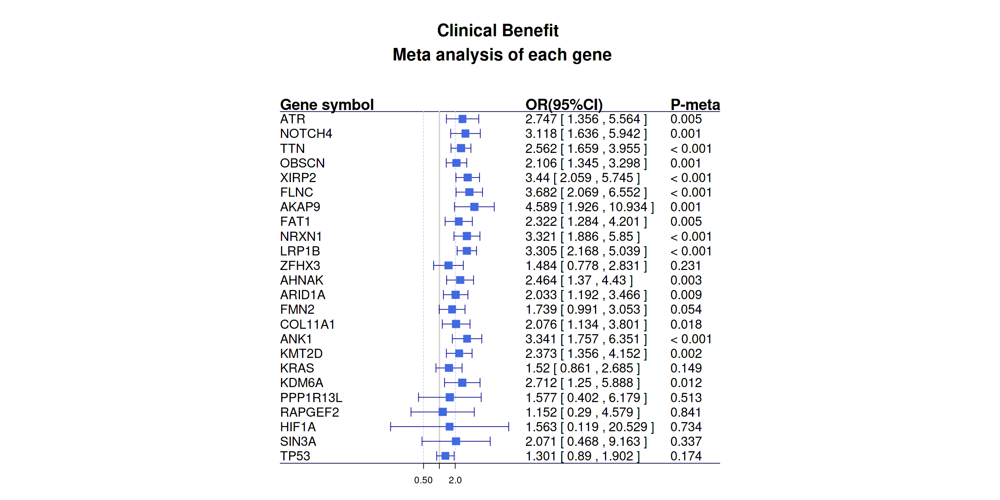

In [83]:
maxup = max(total_cochrane_from_rmeta$upper[!is.infinite(total_cochrane_from_rmeta$upper)],na.rm = T)
minlow = min(total_cochrane_from_rmeta$lower[total_cochrane_from_rmeta$lower != 0],na.rm = T)

    
options(repr.plot.height = 10, repr.plot.width = 20)

tmp_list = list()
tmp_list[["2"]] = gpar(col = "#000044")
tmp_list[[as.character(nrow(total_cochrane_from_rmeta) + 1)]] = gpar(col = "#000044")

p = total_cochrane_from_rmeta %>% 
       forestplot(labeltext = total_tabletext, clip = c(minlow-minlow/10,maxup+maxup/10),xticks = c(0.5,1,2),
                      lty.ci = 1,
                      ci.vertices.height = 0.3,
                     align="l",
                     graphwidth = unit(6,"cm"),
                     lwd.zero = gpar(lwd=2,lty=2),
                     grid = structure(c(0.5, 2), 
                            gp = gpar(lwd = 1,lty = 2, col = "#CCCCFF")),
                     boxsize = 0.5,
                     graph.pos = 2,
#                      zero = 1,
                     title = paste("Clinical Benefit","\n","Meta analysis of each gene"),
                     txt_gp = fpTxtGp(title = gpar(cex = 2),ticks=gpar(cex=1.1),summary=gpar(cex = 1.8),label = gpar(cex = 1.5)),
                     is.summary = c(rep(TRUE, 1), rep(FALSE, nrow(total_cochrane_from_rmeta)-1)),
                     xlog = TRUE, 
                     hrzl_lines = tmp_list,
                     vertices = TRUE,
                     col = fpColors(box = "royalblue",
                                    line = "darkblue",
                                    summary = "royalblue")
                     )
p

In [84]:
pdf(paste("Artical_Figure2/Figure 1/SNVSCORE_single_gene_meta_CB.pdf",sep = ""),width = 10,height = 10)
print(p)
dev.off()

png 
  2

### 备注：每个基因的详细森林图脚本在Artical_Figure2